In [1]:
ID = 1154 #3467 #"default_value"

# Boreal structure dynamics in polygons (boreal tile): 2020

```bash
pip install papermill
TILE_LIST='1154 2000 3460 2675'
for TILE_NUM in $TILE_LIST; do
    echo $TILE_NUM
    papermill /projects/code/maap_tools/notebooks/boreal_dynamics_tile.ipynb /projects/code/maap_tools/notebooks/boreal_dynamics_tile_$TILE_NUM.ipynb -p ID $TILE_NUM --kernel python3
    papermill /projects/code/maap_tools/notebooks/boreal_dynamics_tile_plots.ipynb /projects/code/maap_tools/notebooks/boreal_dynamics_tile_plots_$TILE_NUM.ipynb -p ID $TILE_NUM --kernel ir
done
```

09 January 2025  
Paul Montesano, PhD

Built from `code/maap_tools/extent_report.ipynb`

In [2]:
#pip install cogeo_mosaic

In [3]:
import s3fs
s3 = s3fs.S3FileSystem(anon=True)

In [4]:
try:
    import contextily as ctx
except ModuleNotFoundError:
    print('Need to pip install packages...')
    !pip install contextily
    import contextily as ctx
    
import geopandas as gpd
import pandas as pd
import rasterio
import glob
import os
#import rioxarray
import fiona
from pyproj import CRS, Transformer

import sys
sys.path.append('/projects/code/icesat2_boreal/lib')
import ExtractUtils
import CovariateUtils

import numpy as np

import numpy.ma as ma
from build_stack import *

from plotnine import *
print("Importing packages complete.")
    
# font = {'family' : 'normal',
#         'weight' : 'bold',
#         'size'   : 12}

# plt.rc('font', **font)

NASA MAAP
Importing packages complete.


In [5]:
try:
    from matplotlib_scalebar.scalebar import ScaleBar
except:
    !pip install -U matplotlib-scalebar
    from matplotlib_scalebar.scalebar import ScaleBar

In [6]:
from rastoolslib import *

# Get the dictionary created from the building of the extent-level stack
code/maap_tools/notebooks/extent_stack_boreal_fires.ipynb

In [7]:
POLY_TYPE = 'tile'
FIELDS_LIST = ['tile_num']
ALIAS_LIST = ['Tile num:']

In [8]:
TILE_NUM = int(ID)

In [9]:
get_cog_s3_path(TILE_NUM, mosaiclib.AGB_TINDEX_FN_DICT['2020_v2.1'])

's3://maap-ops-workspace/aliz237/dps_output/run_boreal_biomass_map/dev_v1.5/AGB_H30_2020/full_run/2024/11/25/10/23/00/984527/boreal_agb_2020_202411251732557098_0001154.tif'

In [10]:
mosaiclib.TOPO_TINDEX_FN_DICT

{'c2020orig': 's3://maap-ops-workspace/shared/nathanmthomas/DPS_tile_lists/Topo_tindex_master.csv',
 'c2020updated': 's3://maap-ops-workspace/shared/montesano/DPS_tile_lists/run_build_stack_topo/build_stack_v2023_2/CopernicusGLO30/Topo_tindex_master.csv',
 'c2020updated_v2': 's3://maap-ops-workspace/shared/montesano/DPS_tile_lists/run_build_stack_topo/build_stack_v2024_2/CopernicusGLO30/Topo_tindex_master.csv',
 '2020CONUS': 's3://maap-ops-workspace/shared/montesano/DPS_tile_lists/TOPO/build_stack_v2024_2/CopernicusGLO30CONUS/Topo_tindex_master.csv'}

In [11]:
mosaiclib.MISC_TINDEX_FN_DICT

{'AGE_TP_2020': 's3://maap-ops-workspace/shared/montesano/DPS_tile_lists/AGE/build_stack_v2023_2/AGE_TP_2020/AGE_tindex_master.csv',
 'TCCTREND_TP_2020': 's3://maap-ops-workspace/shared/montesano/DPS_tile_lists/TCCTREND/build_stack_v2023_2/TCCTREND_TP_2020/TCCTREND_tindex_master.csv',
 'TCCTRENDPVAL_TP_2020': 's3://maap-ops-workspace/shared/montesano/DPS_tile_lists/TCCTRENDPVAL/build_stack_v2023_2/TCCTRENDPVAL_TP_2020/TCCTREND_tindex_master.csv',
 'TCC_TP_2020': 's3://maap-ops-workspace/shared/montesano/DPS_tile_lists/TCC/build_stack_v2023_2/TCC_TP_2020/TCC_tindex_master.csv',
 'FORESTAGE100m_2020': 's3://maap-ops-workspace/shared/montesano/DPS_tile_lists/FORESTAGE100m/tile_forestage_v1/forestage_2020/FORESTAGE100m_tindex_master.csv',
 'FORESTAGE_BES_2020': 's3://maap-ops-workspace/shared/montesano/DPS_tile_lists/FORESTAGE/build_stack_v2023_2/FORESTAGE_BES_2020/FORESTAGE_tindex_master.csv',
 'DECPRED_AB_2015': 's3://maap-ops-workspace/shared/montesano/DPS_tile_lists/DECIDFRAC/build_sta

In [12]:
AGE_DATA = 'BESNARD'

In [13]:
boreal_tiles = gpd.read_file(mosaiclib.boreal_tile_index_path)
TILE_EXTENT_GDF = boreal_tiles[boreal_tiles.tile_num == TILE_NUM]

In [14]:
# MAINDIR = 's3://maap-ops-workspace/shared/nathanmthomas/analyze_agb'
# STACKDIR = f'{MAINDIR}/output_mask_agb'

MAINDIR = 's3://maap-ops-workspace/shared/montesano/local_output/extent_stack_boreal_fire/output'.replace('s3://maap-ops-workspace/shared/montesano','/projects/my-public-bucket')
STACKDIR = f'{MAINDIR}/build_stack_clips'

TILE_GDF_FN = f'{STACKDIR}/{POLY_TYPE}_num_{TILE_NUM}.gpkg'

TILE_EXTENT_GDF.to_file(TILE_GDF_FN)

BASIN_COG_DICT = {
    'topo_cog_fn': get_cog_s3_path(TILE_NUM, mosaiclib.TOPO_TINDEX_FN_DICT['c2020updated_v2']),
    'landcover_cog_fn': get_cog_s3_path(TILE_NUM, mosaiclib.LC_TINDEX_FN_DICT['c2020updated']),
    'biomass_cog_fn':   get_cog_s3_path(TILE_NUM, mosaiclib.AGB_TINDEX_FN_DICT['2020_v2.1']),
    'height_cog_fn':    get_cog_s3_path(TILE_NUM, mosaiclib.HT_TINDEX_FN_DICT['2020_v2.1']),
    'standage_cog_fn':  get_cog_s3_path(TILE_NUM, mosaiclib.MISC_TINDEX_FN_DICT['FORESTAGE_BES_2020']),
    'extent_gdf_fn':    TILE_GDF_FN,
    'tcc2020_cog_fn':   get_cog_s3_path(TILE_NUM, mosaiclib.MISC_TINDEX_FN_DICT['TCC_TP_2020']),
    'tccslope_cog_fn':  get_cog_s3_path(TILE_NUM, mosaiclib.MISC_TINDEX_FN_DICT['TCCTREND_TP_2020']),
    'tccpvalue_cog_fn': get_cog_s3_path(TILE_NUM, mosaiclib.MISC_TINDEX_FN_DICT['TCCTRENDPVAL_TP_2020']),
    'decidpred_cog_fn': get_cog_s3_path(TILE_NUM, mosaiclib.MISC_TINDEX_FN_DICT['DECPRED_AB_2015']),
}

In [15]:
# Calc extent area
extent_id = ID

# Get extent gdf
EXTENT_gdf = gpd.read_file(BASIN_COG_DICT['extent_gdf_fn'])

basin_area_ha = EXTENT_gdf.area.to_list()[0] / 1e4
print(f'Area (ha.) of extent id {extent_id}:\t\t{round(basin_area_ha,2)}')

Area (ha.) of extent id 1154:		810000.0


## Map stand age & polygon

In [16]:
# from folium import Map, TileLayer, GeoJson, LayerControl, Icon, Marker, features, Figure, CircleMarker
# from folium import plugins

In [17]:
#import maplib_folium

In [18]:
if False:
    # import importlib
    # importlib.reload(maplib_folium)
    maplib_folium.MAP_REGISTERED_DPS_RESULTS(
                                    gpd.read_file(mosaiclib.boreal_tile_index_path),
                                    None, 
                                    CHECK_TILES_NAME=' ',
                                    map_width=750, map_height=500, SHOW_WIDGETS=False,
                                    # ADD_TILELAYER = [  
                                    #                     tileslib.MISC_TILES_LAYER_DICT['AGE2020'],
                                    #                     tileslib.MISC_TILES_LAYER_DICT['TCCTREND2020'],
                                    #                     tileslib.MISC_TILES_LAYER_DICT['LC2020'],
                                    #                     tileslib.HT_TILE_LAYER_DICT['2020_v2.1'],
                                    #                     tileslib.AGB_TILE_LAYER_DICT['2020_v2.1'],
                                    # ],
                                    ADD_GEOJSONLAYER = [GeoJson(
                                                            data=EXTENT_gdf.to_crs("EPSG:4326").to_json(),
                                                            name=POLY_TYPE,
                                                            style_function=lambda x: {'fillColor': '#orange', 'color': 'orange', 'weight' : 0.75, 'opacity': 1, 'fillOpacity': 0.0},
                                                            tooltip=features.GeoJsonTooltip(fields=FIELDS_LIST, aliases=ALIAS_LIST)
                                                            )
                                                        ]
    )


#### Plot clip extent within boreal 
This will fail if the TILE_NUM specified is NOT in the data frame

In [19]:
xmin, xmax, ymin, ymax = [-170, -50, 40, 80] #[-180, 180, 40, 80]
if EXTENT_gdf.to_crs("EPSG:4326").centroid.x[0] > 0:
    print('Eurasia')
    xmin, xmax, ymin, ymax = [0, 180, 40, 80]

/tmp/ipykernel_9848/2548120936.py:2: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.



In [20]:
boreal_gdf = gpd.read_file('s3://maap-ops-workspace/shared/montesano/databank/arc/wwf_circumboreal_Dissolve.geojson', bbox=(xmin, ymin, xmax, ymax))
hybas_border = gpd.read_file('s3://maap-ops-workspace/shared/nathanmthomas/analyze_agb/input_zones/hybas_lake_NORTHERN_lev03_vc1.gpkg', bbox=(xmin, ymin, xmax, ymax))

Extent ID: 3467
Plot...
Plot...


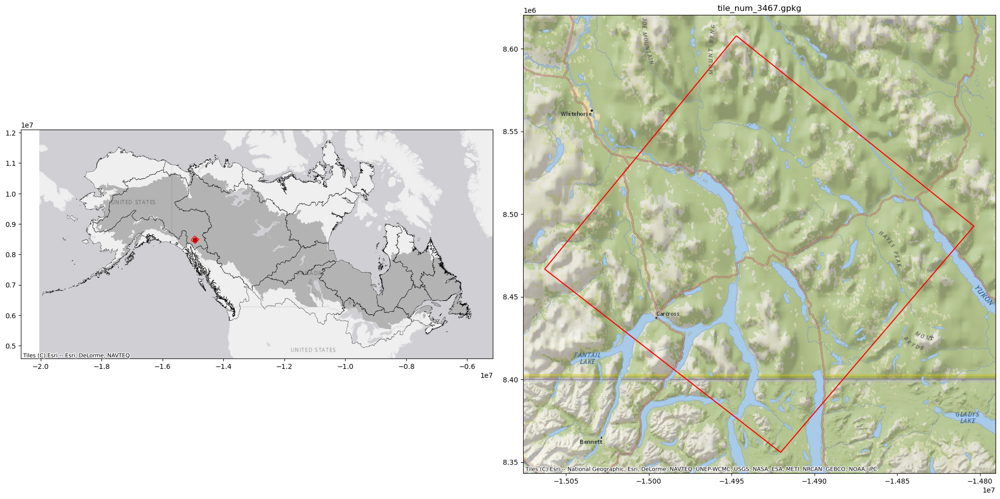

In [20]:
SHOW_FULL_EXTENT = False

print(f'Extent ID: {extent_id}')

print('Plot...')
f, (ax1, ax2) = plt.subplots(figsize=(20, 10), ncols=2, nrows=1, constrained_layout=True)
#ax1.set_title(f"Fire date: {fire_date}")
ax2.set_title(os.path.basename(BASIN_COG_DICT['extent_gdf_fn']))

# Get boreal domain from wwf 
SUB_DOMAIN_selection_geometry = boreal_gdf.cx[xmin:xmax, ymin:ymax].iloc[0].geometry

# Get the basins
hybas_border[hybas_border.intersects(SUB_DOMAIN_selection_geometry)].to_crs(3857).boundary.plot(linewidth=0.25, color='black', ax=ax1)

EXTENT_gdf.to_crs(3857).boundary.plot(color='red', linewidth=1, ax=ax1)
    
print('Plot...')
EXTENT_gdf.centroid.to_crs(3857).plot(color='red', ax=ax1)
EXTENT_gdf.to_crs(3857).boundary.plot(color='red', ax=ax2)
boreal_gdf.cx[xmin:xmax, ymin:ymax].to_crs(3857).plot(alpha=0.25, color='black', marker = '---', ax=ax1)
ctx.add_basemap(ax1,  source=ctx.providers.Esri.WorldGrayCanvas)
ctx.add_basemap(ax2,  source=ctx.providers.Esri.NatGeoWorldMap)

# Create fire poly report of AGB for each LC class

In [21]:
BASIN_COG_DICT

{'topo_cog_fn': 's3://maap-ops-workspace/montesano/dps_output/run_build_stack_topo/build_stack_v2024_2/CopernicusGLO30/2024/07/09/16/40/58/823245/CopernicusGLO30_1154_cog_topo_stack.tif',
 'landcover_cog_fn': 's3://maap-ops-workspace/montesano/dps_output/run_build_stack/build_stack_v2023/LC_ESA_WC_2020/2023/12/07/06/24/57/062395/esa_worldcover_v100_2020_1154_cog.tif',
 'biomass_cog_fn': 's3://maap-ops-workspace/aliz237/dps_output/run_boreal_biomass_map/dev_v1.5/AGB_H30_2020/full_run/2024/11/25/10/23/00/984527/boreal_agb_2020_202411251732557098_0001154.tif',
 'height_cog_fn': 's3://maap-ops-workspace/aliz237/dps_output/run_boreal_biomass_map/dev_v1.5/Ht_H30_2020/full_run/2025/01/13/09/48/10/926195/boreal_ht_2020_202501131736788573_0001154.tif',
 'standage_cog_fn': 's3://maap-ops-workspace/montesano/dps_output/run_build_stack/build_stack_v2023_2/FORESTAGE_BES_2020/2025/03/13/19/30/03/670369/FORESTAGE_BES_2020_1154_cog.tif',
 'extent_gdf_fn': '/projects/my-public-bucket/local_output/exten

In [22]:
import fiona
import rasterio.mask

In [23]:
with fiona.open(BASIN_COG_DICT['extent_gdf_fn'], "r") as shapefile:
    shapes = [feature["geometry"] for feature in shapefile]

### Clips and LC tallies

In [24]:
# The area in hectares of a 30m pixel
area_pix_ha = 0.09

LC nodata value: None
Area (ha.) of extent 1154:		810000.0
lc_arr shape: (3000, 3000)
Biomass nodata value: nan
agb_arr shape: (3000, 3000)

0 Trees 10
	# land cov pixels in class:			6501547
	# Total area (ha.) in class:			585139.23 (72.24% of extent)
	Mg/ha (min,mean,med,max):				0.5799999833106995, 41.380001068115234, nan , 152.25999450683594
	Total AGB (Mg) in class:			24214825.45 (8.21% of extent biomass)
1 Shrubland 20
	# land cov pixels in class:			101226
	# Total area (ha.) in class:			9110.34 (1.12% of extent)
	Mg/ha (min,mean,med,max):				1.3700000047683716, 14.520000457763672, 12.149999618530273 , 91.19000244140625
	Total AGB (Mg) in class:			132326.58 (0.04% of extent biomass)
2 Grassland 30
	# land cov pixels in class:			1448773
	# Total area (ha.) in class:			130389.56999999999 (16.1% of extent)
	Mg/ha (min,mean,med,max):				0.6600000262260437, 16.200000762939453, nan , 134.74000549316406
	Total AGB (Mg) in class:			2112845.21 (0.72% of extent biomass)
3 Cropland 40
	# lan

<timed exec>:84: RuntimeWarning: All-NaN axis encountered
<timed exec>:84: RuntimeWarning: Mean of empty slice


	Mg/ha (min,mean,med,max):				ERROR
	Total AGB (Mg) in class:			0.0 (0.0% of extent biomass)
5 Barren/sparse 60
	# land cov pixels in class:			25996
	# Total area (ha.) in class:			2339.64 (0.29% of extent)
	Mg/ha (min,mean,med,max):				ERROR
	Total AGB (Mg) in class:			0.0 (0.0% of extent biomass)
6 Snow and ice 70
	# land cov pixels in class:			0
	# Total area (ha.) in class:			0.0 (0.0% of extent)
7 Open water 80
	# land cov pixels in class:			860399
	# Total area (ha.) in class:			77435.91 (9.56% of extent)
	Mg/ha (min,mean,med,max):				ERROR
	Total AGB (Mg) in class:			0.0 (0.0% of extent biomass)
CPU times: user 6.65 s, sys: 1.67 s, total: 8.32 s
Wall time: 11.7 s


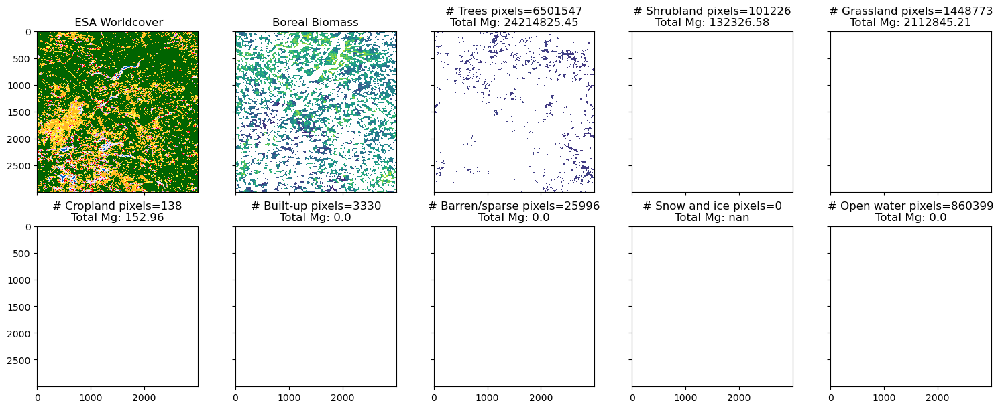

In [25]:
%%time

# Subplots
# LC map + AGB + AGB for each LC value in names_worldcover
num_groups = 2 + len(values_worldcover)
ncols = 5
nrows = (num_groups + 1) // ncols

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, 3 * nrows), 
                         constrained_layout=True, sharex=True, sharey=True)
axes = axes.ravel()

with rasterio.open(BASIN_COG_DICT['landcover_cog_fn']) as dataset:
    
    lc_arr_3d, out_transform = rasterio.mask.mask(dataset, shapes, crop=True)
    lc_arr = lc_arr_3d[0,:,:]
    lc_meta = dataset.profile
    print(f"LC nodata value: {dataset.nodata}")
    print(f"Area (ha.) of extent {ID}:\t\t{basin_area_ha}")
    print(f"lc_arr shape: {lc_arr.shape}")
    
    # NoData value is 0; mask this
    lc_arr = np.ma.masked_where( lc_arr == 0, lc_arr)
    
    #cols_worldcover = ["white","green","orange","yellow","purple","red","brown","gray","blue","pink","cyan","black"]
    #cols_mask = ["white", "red"]
    #values_mask = [0,1]

    #cmap_masked = ListedColormap(cols_mask)
    #norm_masked= BoundaryNorm(values_mask, len(cols_mask))
    
    axes[0].imshow(lc_arr, cmap=cmap_worldcover, norm=norm_worldcover)
    axes[0].set_title(f" ESA Worldcover")
    
    # Find sum of AGB per LC class
    # multiply by AGB values and sum
    with rasterio.open(BASIN_COG_DICT['biomass_cog_fn']) as dataset_agb:
        
        agb_arr_3d, out_transform = rasterio.mask.mask(dataset_agb, shapes, crop=True)

        # AGB mean and std layers
        agb_std_arr = agb_arr_3d[1,:,:] # First grab the std arr 
        agb_arr = agb_arr_3d[0,:,:] # then overwrite with mean arr here
        
        #print('\n', dataset_agb.profile,'\n')
        print(f"Biomass nodata value: {dataset_agb.nodata}")
        
        #agb_arr = np.ma.masked_where( (lc_arr==0) | (agb_arr<0), agb_arr)
        agb_arr = np.ma.masked_where(  (agb_arr<0), agb_arr)
        total_mg_all = np.nansum(agb_arr)
        
        print(f"agb_arr shape: {agb_arr.shape}\n")
        axes[1].imshow(agb_arr, clim=(0,75))
        axes[1].set_title(f"Boreal Biomass")
    
        for i, (ax, LC_VALUE) in enumerate(zip(axes[2:], values_worldcover)):

            LC_NAME = names_worldcover[i]
            print(i, LC_NAME, LC_VALUE)

            # For LC value of interest
            #lc_agb_arr = np.ma.masked_where( (lc_arr == 0) | (agb_arr < 0) | (lc_arr != LC_VALUE) , agb_arr)
            lc_agb_arr = np.ma.masked_where( (lc_arr != LC_VALUE) , agb_arr)
            
            num_lc_pixels_in_mask = lc_agb_arr[~np.isnan(lc_agb_arr)].count() 
            num_lc_pixels_in_mask = lc_agb_arr.count()
            total_lc_area_ha = num_lc_pixels_in_mask * area_pix_ha
            
            print(f"\t# land cov pixels in class:\t\t\t{num_lc_pixels_in_mask}")
            print(f"\t# Total area (ha.) in class:\t\t\t{total_lc_area_ha} ({round(100 * total_lc_area_ha / basin_area_ha,2)}% of extent)")
            
            total_mg_lc = np.nan
            
            if False and LC_VALUE == 40:
                list_of_vals = lc_agb_arr[lc_agb_arr.mask == False].tolist()
                print(list_of_vals)
                #print(f"\t\t{(sum(list_of_vals) / num_lc_pixels_in_mask) * area_pix_ha}")
                
            if LC_VALUE == 10:
                trees_lc_agb_arr = lc_agb_arr
            
            if num_lc_pixels_in_mask > 0:

                #### --- ValueError: assignment destination is read-only 
                try:
                    print(f"\tMg/ha (min,mean,med,max):\t\t\t\t{round(np.nanmin(lc_agb_arr)/1,2)}, {round(np.nanmean(lc_agb_arr)/1,2)}, {round(np.ma.median(lc_agb_arr)/1,2)} , {round(np.nanmax(lc_agb_arr)/1,2)}")
                except:
                    print(f"\tMg/ha (min,mean,med,max):\t\t\t\tERROR")

                # ***To get error bars on total (Mg), need to have mean AGB raster and sd AGB raster, and use them to sample a normal distribution of AGB values per pixel, n=100 times per pixel?
                # Then get all the totals from the n layers, and get the mean total and the sd of the total
                #total_mg_lc = (lc_agb_arr.sum() / num_lc_pixels_in_mask) * area_pix_ha
                total_mg_lc = round(np.nansum(lc_agb_arr * area_pix_ha), 2)/1
                print(f"\tTotal AGB (Mg) in class:\t\t\t{round( total_mg_lc, 2)} ({round(100 * total_mg_lc / total_mg_all,2)}% of extent biomass)")
            
            # To plot with a legend: https://www.earthdatascience.org/courses/use-data-open-source-python/intro-raster-data-python/raster-data-processing/classify-plot-raster-data-in-python/
            ax.imshow(lc_agb_arr, clim=(-100,700))
            ax.set_title(f"# {LC_NAME} pixels={num_lc_pixels_in_mask}\nTotal Mg: {round(total_mg_lc,2)}")
            
            #show(lc_mask, cmap=cmap_masked, norm=norm_masked)
            #show_hist(lc_mask, bins=len(values_masked)+1, lw=0.0, stacked=False, alpha=0.3, histtype='stepfilled', title="Histogram of ESA Worldcover Class Values")

In [26]:
get_discrete_cmap(cmap=cmap_worldcover, N_COLORS=len(dict_worldcover_values.values()))
len(dict_worldcover_classes.values())
#cmap_worldcover

10

In [27]:
names_worldcover

['Trees',
 'Shrubland',
 'Grassland',
 'Cropland',
 'Built-up',
 'Barren/sparse',
 'Snow and ice',
 'Open water',
 'Herbaceous\nwetland',
 'Moss and lichen']

## Read rasters

In [28]:
agb_arr = read_clip_raster(BASIN_COG_DICT['biomass_cog_fn'], shapes, ndv=np.nan)
agb_arr.shape

{'driver': 'GTiff', 'dtype': 'float32', 'nodata': nan, 'width': 3000, 'height': 3000, 'count': 2, 'crs': CRS.from_wkt('PROJCS["unnamed",GEOGCS["GRS 1980(IUGG, 1980)",DATUM["unknown",SPHEROID["GRS80",6378137,298.257222101],TOWGS84[0,0,0,0,0,0,0]],PRIMEM["Greenwich",0],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]]],PROJECTION["Albers_Conic_Equal_Area"],PARAMETER["latitude_of_center",40],PARAMETER["longitude_of_center",180],PARAMETER["standard_parallel_1",50],PARAMETER["standard_parallel_2",70],PARAMETER["false_easting",0],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH]]'), 'transform': Affine(30.0, 0.0, 4868521.999999994,
       0.0, -30.0, 6003304.000000009), 'blockxsize': 512, 'blockysize': 512, 'tiled': True, 'compress': 'lzw', 'interleave': 'pixel'}


(2, 3000, 3000)

In [29]:
lc_arr = read_clip_raster(BASIN_COG_DICT['landcover_cog_fn'], shapes)
lc_arr.shape

{'driver': 'GTiff', 'dtype': 'uint8', 'nodata': None, 'width': 3000, 'height': 3000, 'count': 1, 'crs': CRS.from_wkt('PROJCS["unnamed",GEOGCS["GRS 1980(IUGG, 1980)",DATUM["unknown",SPHEROID["GRS80",6378137,298.257222101],TOWGS84[0,0,0,0,0,0,0]],PRIMEM["Greenwich",0],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]]],PROJECTION["Albers_Conic_Equal_Area"],PARAMETER["latitude_of_center",40],PARAMETER["longitude_of_center",180],PARAMETER["standard_parallel_1",50],PARAMETER["standard_parallel_2",70],PARAMETER["false_easting",0],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH]]'), 'transform': Affine(30.0, 0.0, 4868521.999999994,
       0.0, -30.0, 6003304.000000009), 'blockxsize': 256, 'blockysize': 256, 'tiled': True, 'compress': 'deflate', 'interleave': 'band'}


(1, 3000, 3000)

In [30]:
import matplotlib

### AGB: mask with LC

In [31]:
# List of LC values to mask
val_lc_nodata, val_lc_trees, val_lc_water = [0, 10, 80]
vals_lc_to_mask = [val_lc_nodata, val_lc_water]

In [32]:
agb_arr_mask_LC = np.ma.masked_where( np.isin(np.repeat(lc_arr, 2, axis=0) , vals_lc_to_mask), agb_arr)
agb_arr_mask_LC.shape

(2, 3000, 3000)

In [33]:
#agb_arr_masked2 = np.ma.masked_where( np.isin(lc_arr_3d_2 , vals_lc_to_mask), np.stack([agb_arr, agb_std_arr]))

### Stand age: mask with LC

In [34]:
ndv_standage = -9999
standage_arr = read_clip_raster(BASIN_COG_DICT['standage_cog_fn'], shapes, bandnum=None, ndv=ndv_standage) #3d arr
print(standage_arr.shape)

{'driver': 'GTiff', 'dtype': 'float64', 'nodata': -9999.0, 'width': 3000, 'height': 3000, 'count': 2, 'crs': CRS.from_wkt('PROJCS["unnamed",GEOGCS["GRS 1980(IUGG, 1980)",DATUM["unknown",SPHEROID["GRS80",6378137,298.257222101],TOWGS84[0,0,0,0,0,0,0]],PRIMEM["Greenwich",0],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]]],PROJECTION["Albers_Conic_Equal_Area"],PARAMETER["latitude_of_center",40],PARAMETER["longitude_of_center",180],PARAMETER["standard_parallel_1",50],PARAMETER["standard_parallel_2",70],PARAMETER["false_easting",0],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH]]'), 'transform': Affine(30.0, 0.0, 4868521.999999994,
       0.0, -30.0, 6003304.000000009), 'blockxsize': 256, 'blockysize': 256, 'tiled': True, 'compress': 'deflate', 'interleave': 'pixel'}
(2, 3000, 3000)


In [35]:
standage_arr_mask_LC = np.ma.masked_where( np.isin(np.repeat(lc_arr, 2, axis=0) , vals_lc_to_mask), standage_arr)
standage_arr_mask_LC.shape

(2, 3000, 3000)

In [36]:
# #lc_trees_3d = np.expand_dims(np.isin(lc_arr, vals_lc_to_mask), axis=0)
# lc_arr_3d_2 = np.repeat(lc_arr_3d, 2, axis=0)
# lc_arr_3d_2.shape

In [37]:
#agb_arr_masked1 = np.ma.masked_where( (lc_arr == 0  ) | (lc_arr == 80) , agb_arr)
#agb_arr_masked2 = np.ma.masked_where( np.isin(lc_arr_3d_2 , vals_lc_to_mask), np.stack([agb_arr, agb_std_arr]))
lc_arr.shape


(1, 3000, 3000)

Extent:		1154
Total ha.:		729891.27
Mean Mg/ha:		36.369998931884766
Total Pg.:		0.026499999687075615
Mean Mg/ha in trees:	41.380001068115234
Total Pg. in trees:	0.02419999986886978


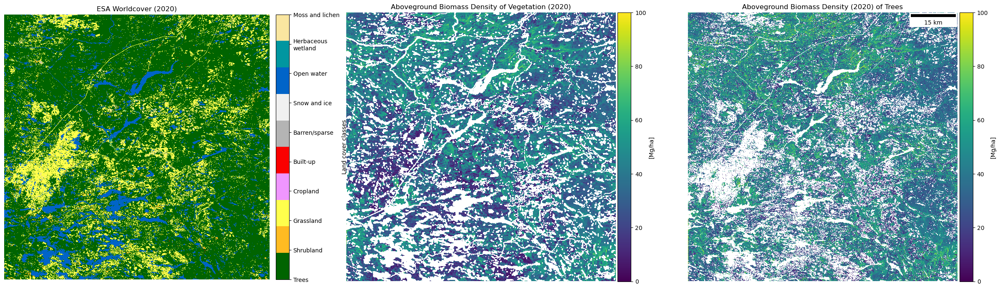

In [39]:
LC_VAL = dict_worldcover_values.get('Trees') #10
LC_ticks = list(dict_worldcover_classes.keys())
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(30,30), sharex=True, sharey=True)

# Scalebar doesnt seem correct
scalebar = ScaleBar(30) # <-- each pixel (unit) is 30m
plt.gca().add_artist(scalebar)

##########
# AGB arrays
# With a water mask
agb_arr_masked = np.ma.masked_where(  np.isin(lc_arr[0,:,:] , vals_lc_to_mask) , agb_arr[0,:,:])
agb_std_arr_masked = np.ma.masked_where(  np.isin(lc_arr[0,:,:] , vals_lc_to_mask) , agb_arr[1,:,:]) 

##########
# Without a water mask
#agb_arr_masked = np.ma.masked_where( (lc_arr == 0  )  ,agb_arr)

##########
# AGB density of ESA Worldcover v1 2020 trees 
agb_arr_masked_trees = np.ma.masked_where( (lc_arr[0,:,:] != LC_VAL  ), agb_arr_masked)
agb_std_arr_masked_trees = np.ma.masked_where( (lc_arr[0,:,:] != LC_VAL  ), agb_std_arr_masked)

print(f"Extent:\t\t{ID}")
print(f"Total ha.:\t\t{(agb_arr_masked[~np.isnan(agb_arr_masked)].count() * area_pix_ha ) }")
print(f"Mean Mg/ha:\t\t{ round(np.nanmean(agb_arr_masked)/1,2) }")
print(f"Total Pg.:\t\t{round(np.nansum(agb_arr_masked)/1e9 * area_pix_ha,4) }")
print(f"Mean Mg/ha in trees:\t{ round(np.nanmean(agb_arr_masked_trees)/1,2) }")
print(f"Total Pg. in trees:\t{round(np.nansum(agb_arr_masked_trees)/1e9 * area_pix_ha, 4) }")

# Plots

# Showing only trees LC
#m2 = axes[1].imshow(lc_arr_trees, cmap=cmap_worldcover, norm=norm_worldcover)
# Showing all LC classes
#m1 = axes[0].imshow(lc_arr, cmap=cmap_worldcover, norm=norm_worldcover)
#add_colorbar(m1, 'Land cover classes')
m1 = axes[0].imshow(lc_arr[0,:,:], cmap=get_discrete_cmap(cmap=cmap_worldcover, N_COLORS=len(dict_worldcover_classes.values()))
                    #, norm=norm_worldcover
                    , vmin=LC_ticks[0], vmax=LC_ticks[-1], interpolation='nearest'
                   )
cbar = do_colorbar(axes[0], fig, m1, 'Land cover classes', EXTEND=None, TICKS=LC_ticks)
cbar.ax.set_yticklabels(dict_worldcover_classes.values())
axes[0].set_title('ESA Worldcover (2020)')
axes[0].axis('off')

m2 = axes[1].imshow(agb_arr_masked, clim=(0,100) )
add_colorbar(m2, '[Mg/ha]')
m2 = axes[1].set_title('Aboveground Biomass Density of Vegetation (2020)')
axes[1].axis('off')

# Show AGB for tree
m3 = axes[2].imshow(agb_arr_masked_trees, clim=(0,100), cmap='viridis', interpolation='nearest')
add_colorbar(m3, '[Mg/ha]')
m3 = axes[2].set_title('Aboveground Biomass Density (2020) of Trees')
axes[2].axis('off')

if False:
    # Convert AGB density to total
    m4 = axes[3].imshow(agb_arr_masked_trees* area_pix_ha, clim=(0,10), cmap='plasma')
    add_colorbar(m3, '[Mg]')
    m4 = axes[3].set_title('Aboveground Biomass (2020) of Trees')
    axes[3].axis('off')

# Carbon accumulation in forests  (carbon flux density [MgC/ha/yr]

C accumulation depends on current AGB and stand age  

Age input options:  
[1] TerraPulse maps give boreal stand age computed for 'Forest' pixels using breakpoints intentified empirically from a time series from the Landsat record (1984-2020)  
+ 0 values indicate no 'Forest'
+ 50 values indicate age older than Landsat record
+ 30m native res
   
[2] Besnard et al Forest Age
+ derived globally from machine learning based on 10s of thousands of plots
+ 20 model ensemble
+ 100m native res

### Read and clip to poly here

In [40]:
BASIN_COG_DICT['topo_cog_fn']

's3://maap-ops-workspace/montesano/dps_output/run_build_stack_topo/build_stack_v2024_2/CopernicusGLO30/2024/07/09/16/40/58/823245/CopernicusGLO30_1154_cog_topo_stack.tif'

In [41]:
# Topo
topo_arr = read_clip_raster(BASIN_COG_DICT['topo_cog_fn'], shapes, bandnum=None, ndv=-9999)

{'driver': 'GTiff', 'dtype': 'float32', 'nodata': -9999.0, 'width': 3000, 'height': 3000, 'count': 5, 'crs': CRS.from_wkt('PROJCS["unnamed",GEOGCS["GRS 1980(IUGG, 1980)",DATUM["unknown",SPHEROID["GRS80",6378137,298.257222101],TOWGS84[0,0,0,0,0,0,0]],PRIMEM["Greenwich",0],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]]],PROJECTION["Albers_Conic_Equal_Area"],PARAMETER["latitude_of_center",40],PARAMETER["longitude_of_center",180],PARAMETER["standard_parallel_1",50],PARAMETER["standard_parallel_2",70],PARAMETER["false_easting",0],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH]]'), 'transform': Affine(30.0, 0.0, 4868521.999999994,
       0.0, -30.0, 6003304.000000009), 'blockxsize': 256, 'blockysize': 256, 'tiled': True, 'compress': 'deflate', 'interleave': 'pixel'}


In [42]:
# TerraPulse data
ndv_tccslope = 255
ndv_tcc = 255

tccslope_arr = read_clip_raster(BASIN_COG_DICT['tccslope_cog_fn'], shapes, bandnum=1, ndv=ndv_tccslope)
tcc2020_arr =  read_clip_raster(BASIN_COG_DICT['tcc2020_cog_fn'], shapes, bandnum=1, ndv=ndv_tcc)
tccpvalue_arr =  read_clip_raster(BASIN_COG_DICT['tccpvalue_cog_fn'], shapes, bandnum=1, ndv=ndv_tcc)

{'driver': 'GTiff', 'dtype': 'float32', 'nodata': None, 'width': 3000, 'height': 3000, 'count': 1, 'crs': CRS.from_wkt('PROJCS["unnamed",GEOGCS["GRS 1980(IUGG, 1980)",DATUM["unknown",SPHEROID["GRS80",6378137,298.257222101],TOWGS84[0,0,0,0,0,0,0]],PRIMEM["Greenwich",0],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]]],PROJECTION["Albers_Conic_Equal_Area"],PARAMETER["latitude_of_center",40],PARAMETER["longitude_of_center",180],PARAMETER["standard_parallel_1",50],PARAMETER["standard_parallel_2",70],PARAMETER["false_easting",0],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH]]'), 'transform': Affine(30.0, 0.0, 4868521.999999994,
       0.0, -30.0, 6003304.000000009), 'blockxsize': 256, 'blockysize': 256, 'tiled': True, 'compress': 'deflate', 'interleave': 'band'}
{'driver': 'GTiff', 'dtype': 'uint8', 'nodata': None, 'width': 3000, 'height': 3000, 'count': 1, 'crs': CRS.from_wkt('PROJCS["unnamed",GEOGCS["GRS 1980(IU

In [43]:
# MAssey et al
decidpred_arr =  read_clip_raster(BASIN_COG_DICT['decidpred_cog_fn'], shapes, bandnum=1, ndv=255)

# ICESat-2 Boreal
height_arr = read_clip_raster(BASIN_COG_DICT['height_cog_fn'], shapes, bandnum=1, ndv=np.nan)

{'driver': 'GTiff', 'dtype': 'uint8', 'nodata': 255.0, 'width': 3000, 'height': 3000, 'count': 1, 'crs': CRS.from_wkt('PROJCS["unnamed",GEOGCS["GRS 1980(IUGG, 1980)",DATUM["unknown",SPHEROID["GRS80",6378137,298.257222101],TOWGS84[0,0,0,0,0,0,0]],PRIMEM["Greenwich",0],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]]],PROJECTION["Albers_Conic_Equal_Area"],PARAMETER["latitude_of_center",40],PARAMETER["longitude_of_center",180],PARAMETER["standard_parallel_1",50],PARAMETER["standard_parallel_2",70],PARAMETER["false_easting",0],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH]]'), 'transform': Affine(30.0, 0.0, 4868521.999999994,
       0.0, -30.0, 6003304.000000009), 'blockxsize': 256, 'blockysize': 256, 'tiled': True, 'compress': 'deflate', 'interleave': 'band'}
{'driver': 'GTiff', 'dtype': 'float32', 'nodata': nan, 'width': 3000, 'height': 3000, 'count': 2, 'crs': CRS.from_wkt('PROJCS["unnamed",GEOGCS["GRS 1980(IU

### Stand Age
+ Stand age is the estimate (years) since the time elapsed since a pixel was first classified as 'forest' (exceeds a 'forest' probability threshold)
+ often, pixels < 30% TCC do no satify the 'forest' probability threshold

In [44]:
standage_arr_ndv = read_clip_raster(BASIN_COG_DICT['standage_cog_fn'], shapes, bandnum=None, ndv=-9999)
standage_arr = read_clip_raster(BASIN_COG_DICT['standage_cog_fn'], shapes, bandnum=None)

standage_classified_ndv = classify_forest(standage_arr_ndv[0,:,:])
standage_classified_ndv = np.ma.masked_where( np.isin(lc_arr[0,:,:] , vals_lc_to_mask), standage_classified_ndv)
standage_classified = classify_forest(standage_arr[0,:,:])
standage_classified = np.ma.masked_where( np.isin(lc_arr[0,:,:] , vals_lc_to_mask), standage_classified)

{'driver': 'GTiff', 'dtype': 'float64', 'nodata': -9999.0, 'width': 3000, 'height': 3000, 'count': 2, 'crs': CRS.from_wkt('PROJCS["unnamed",GEOGCS["GRS 1980(IUGG, 1980)",DATUM["unknown",SPHEROID["GRS80",6378137,298.257222101],TOWGS84[0,0,0,0,0,0,0]],PRIMEM["Greenwich",0],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]]],PROJECTION["Albers_Conic_Equal_Area"],PARAMETER["latitude_of_center",40],PARAMETER["longitude_of_center",180],PARAMETER["standard_parallel_1",50],PARAMETER["standard_parallel_2",70],PARAMETER["false_easting",0],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH]]'), 'transform': Affine(30.0, 0.0, 4868521.999999994,
       0.0, -30.0, 6003304.000000009), 'blockxsize': 256, 'blockysize': 256, 'tiled': True, 'compress': 'deflate', 'interleave': 'pixel'}
{'driver': 'GTiff', 'dtype': 'float64', 'nodata': -9999.0, 'width': 3000, 'height': 3000, 'count': 2, 'crs': CRS.from_wkt('PROJCS["unnamed",GEOGCS["GR

In [45]:
# standage_classified_ndv = np.ma.where(standage_arr_ndv <= 0, 0, 
#                                       np.ma.where( ((standage_arr_ndv > 0) & (standage_arr_ndv < THRESH_REGROW_AGE)), 1, 
#                                                  (np.ma.where( ((standage_arr_ndv >= THRESH_REGROW_AGE)  & (standage_arr_ndv < THRESH_YOUNG_AGE)), 2, 
#                                                      (np.ma.where( ((standage_arr_ndv >= THRESH_YOUNG_AGE)  & (standage_arr_ndv < THRESH_MATURE_AGE)), 3, 
#                                                                   (np.ma.where( (standage_arr_ndv >= THRESH_MATURE_AGE), 4, 
#                                                                           0
#                                                                         ))))))))[0,:,:]
# standage_classified_ndv = np.ma.masked_where( np.isin(np.repeat(lc_arr, 2, axis=0) , vals_lc_to_mask), standage_classified_ndv)[0,:,:]

In [46]:
# standage_classified = np.ma.where(standage_arr <= 0, 0, 
#                                       np.ma.where( ((standage_arr > 0) & (standage_arr < THRESH_REGROW_AGE)), 1, 
#                                                  (np.ma.where( ((standage_arr >= THRESH_REGROW_AGE)  & (standage_arr < THRESH_YOUNG_AGE)), 2, 
#                                                      (np.ma.where( ((standage_arr >= THRESH_YOUNG_AGE)  & (standage_arr < THRESH_MATURE_AGE)), 3,         
#                                                              (np.ma.where( (standage_arr >= THRESH_MATURE_AGE), 4,
#                                                                           0
#                                                                         ))))))))[0,:,:]
# #standage_classified = np.ma.masked_where( np.isin(np.repeat(lc_arr, 2, axis=0) , vals_lc_to_mask), standage_classified)[0,:,:]

[0 1 2 3]
standage_classified_ndv: [0 1 2 3], [4027821  646781 3093207 1232191]
[0 1 2 3]
standage_classified: [0 1 2 3], [4027821  646781 3093207 1232191]


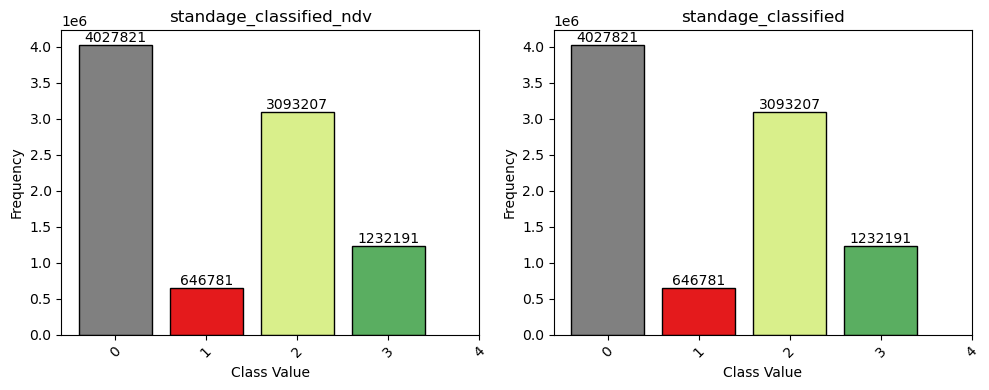

In [47]:
plot_raster_histograms(standage_classified_ndv.data, standage_classified.data, values_standage, colors_standage, "standage_classified_ndv", "standage_classified") # must plot .data b/c masked array (eg after lc mask) messes things up

In [48]:
# fig, ax = plt.subplots(1, 1, figsize=(6, 4)) 
# plot_single_histogram(ax, standage_classified.data, "standage_classified", values_standage, colors_standage) 

(np.float64(-0.5), np.float64(2999.5), np.float64(2999.5), np.float64(-0.5))

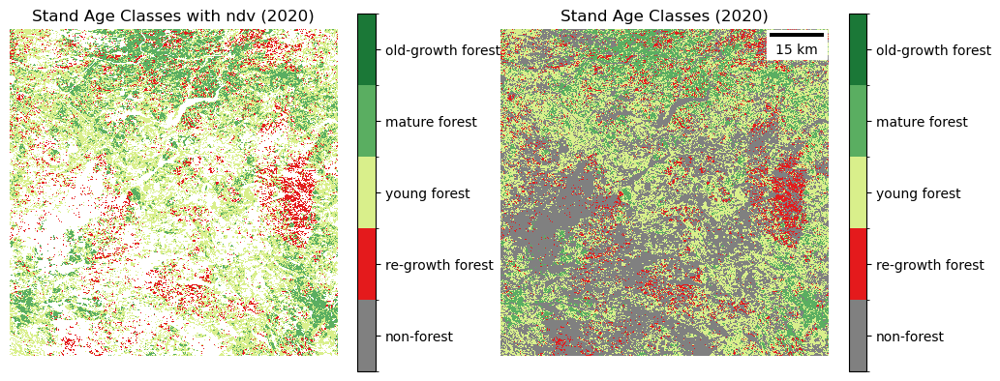

In [106]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12,6), sharex=True, sharey=True)

# Scalebar doesnt seem correct
scalebar = ScaleBar(30) # <-- each pixel (unit) is 30m
plt.gca().add_artist(scalebar)

norm_standage_cats = mcolors.BoundaryNorm(np.arange(-0.5, len(names_standage)+0.5, 1), cmap_standage.N)

# Showing trees instead of all LC classes
im = axes[0].imshow(standage_classified_ndv, cmap=cmap_standage
                 , norm=norm_standage_cats, interpolation='nearest'
                )
#add_colorbar(z, 'Stand age classes')
# Add a colorbar
cbar = fig.colorbar(im, ticks=np.arange(len(names_standage)), shrink=0.8)
cbar.ax.set_yticklabels(names_standage)

axes[0].set_title('Stand Age Classes with ndv (2020)')
axes[0].axis('off')

# Showing trees instead of all LC classes
im = axes[1].imshow(standage_classified, cmap=cmap_standage
                 , norm=norm_standage_cats, interpolation='nearest'
                )
#add_colorbar(z, 'Stand age classes')
# Add a colorbar
cbar = fig.colorbar(im, ticks=np.arange(len(names_standage)), shrink=0.8)
cbar.ax.set_yticklabels(names_standage)

axes[1].set_title('Stand Age Classes (2020)')
axes[1].axis('off')

## Final stand age classified

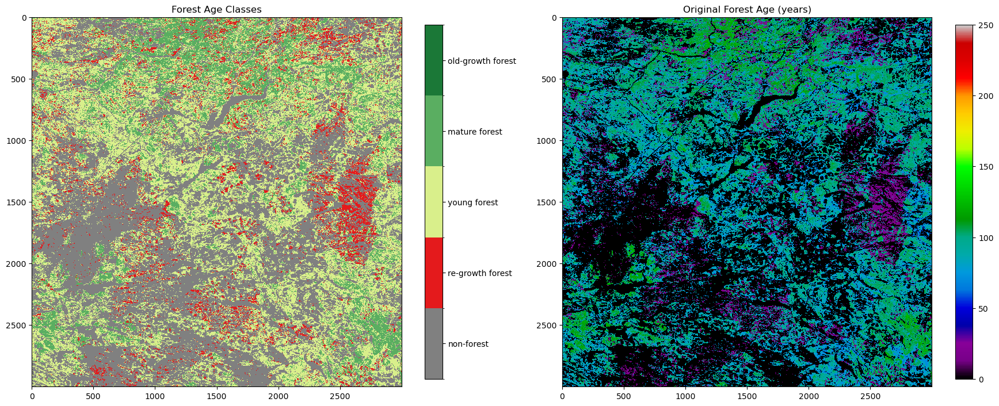


Forest Classification Summary:
   Class ID        Class Name  Pixel Count  Percentage
0         0        non-forest      4027821   44.753567
1         1  re-growth forest       646781    7.186456
2         2      young forest      3093207   34.368967
3         3     mature forest      1232191   13.691011

Forest Age Classification Statistics:


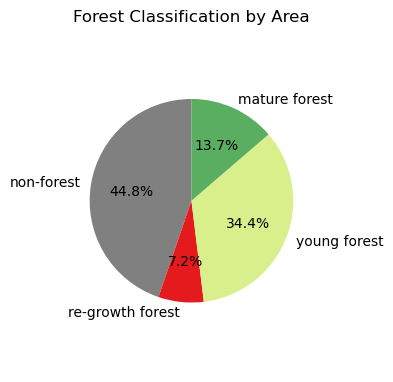

In [51]:
standage_classified, stats = classify_and_analyze_forest_age(standage_arr[0,:,:])
standage_classified = np.ma.masked_where( np.isin(lc_arr[0,:,:] , vals_lc_to_mask), standage_classified)

# Optional: Save the classification result
# np.save('forest_classification.npy', classified_forest)
#stats.to_csv('forest_classification_stats.csv', index=False)

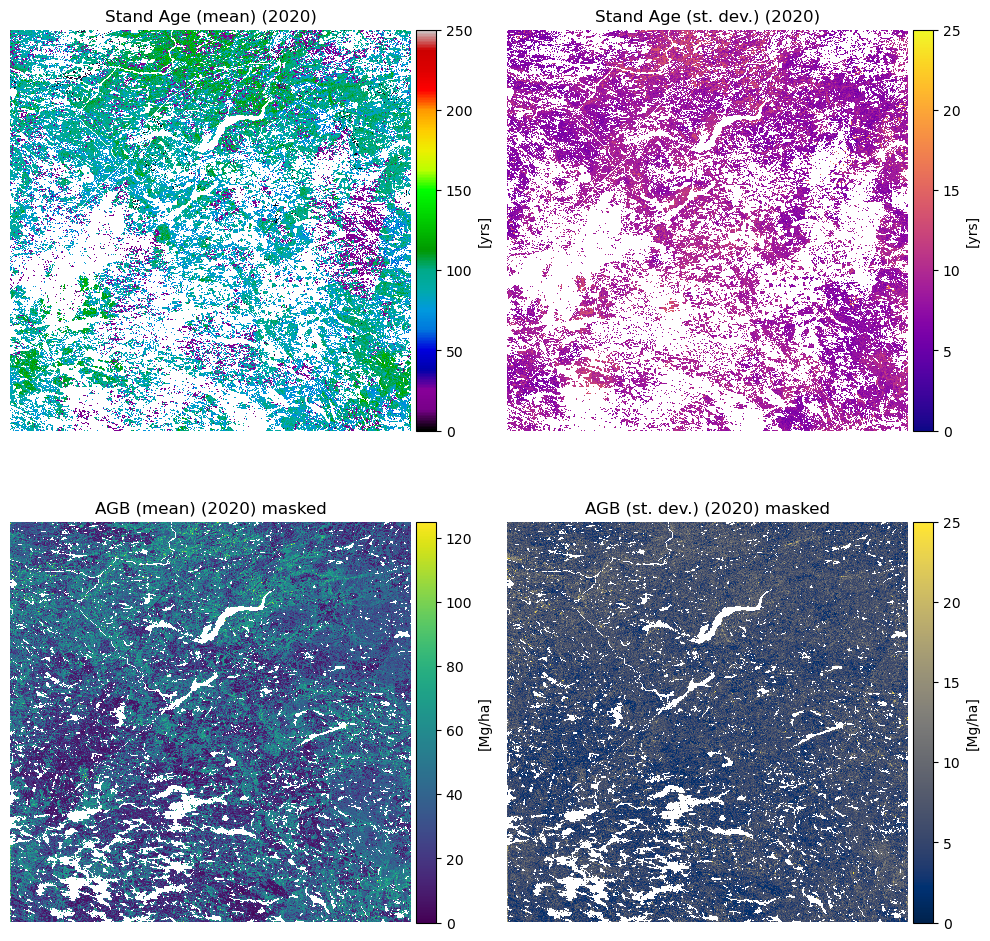

In [107]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10,10), sharex=True, sharey=True)
# Age
m1 = axes[0,0].imshow(standage_arr_mask_LC[0,:,:], cmap='nipy_spectral', vmin=0, vmax=250, interpolation='nearest')
add_colorbar(m1, '[yrs]')
axes[0,0].set_title('Stand Age (mean) (2020)')
axes[0,0].axis('off')

m2 = axes[0,1].imshow(standage_arr_mask_LC[1,:,:], cmap='plasma', vmin=0, vmax=25, interpolation='nearest')
add_colorbar(m2, '[yrs]')
axes[0,1].set_title('Stand Age (st. dev.) (2020)')
axes[0,1].axis('off')

# AGB
m1 = axes[1,0].imshow(agb_arr_mask_LC[0,:,:], cmap='viridis', vmin=0, vmax=125, interpolation='nearest')
add_colorbar(m1, '[Mg/ha]')
axes[1,0].set_title('AGB (mean) (2020) masked')
axes[1,0].axis('off')

m2 = axes[1,1].imshow(agb_arr_mask_LC[1,:,:], cmap='cividis', vmin=0, vmax=25, interpolation='nearest')
add_colorbar(m2, '[Mg/ha]')
axes[1,1].set_title('AGB (st. dev.) (2020) masked')
axes[1,1].axis('off')

plt.tight_layout()

### Mask stand age (mean, std) with `ndv` and `land cover` in a few ways

In [60]:
#
# Stand age (mean, std) masked with its nodata
#
if AGE_DATA == 'TP':
    MAX_STANDAGE = 36
    VALUE_OUTSIDE_AGE_RANGE = 50
else:
    # note - no 0 values in Besnard age data
    MAX_STANDAGE = 1000
    VALUE_OUTSIDE_AGE_RANGE = 1000

# Mask using ndv
print(f'ndv: {ndv_standage}')
standage_arr_masked = np.ma.masked_where( (standage_arr == ndv_standage ), standage_arr) # <-- note, leaving in age = 0 here, technically not 'stands'? or just 'recently disturbed stands' 
standage_arr_masked = np.ma.masked_where( np.isin(np.repeat(lc_arr, 2, axis=0), vals_lc_to_mask) , standage_arr_masked)

# C accum adjustment: convert 0 to 0.5 -  to get C accumulation if/when denom is 0 - 
standage_arr_masked_adj = np.ma.where(standage_arr_masked[0,:,:] == 0, 0.5, np.ma.where(standage_arr_masked[0,:,:] == VALUE_OUTSIDE_AGE_RANGE, MAX_STANDAGE, standage_arr_masked)) 

# To only focus on trees w/o C accum adjustment
standage_arr_masked_trees = np.ma.masked_where( np.repeat(lc_arr, 2, axis=0) != val_lc_trees , standage_arr_masked)

# C accum adjustment with a focus only on trees
standage_arr_masked_adj_trees = np.ma.masked_where( np.repeat(lc_arr, 2, axis=0) != val_lc_trees, standage_arr_masked_adj)
    
print(standage_arr_masked.shape)
standage_arr[0,:,:].min()

ndv: -9999
(2, 3000, 3000)


np.float64(-9999.0)

#### if no forest age = 0 in denominator, then *masked_adj will be same as *masked

standage_arr;		shape: (2, 3000, 3000); min: -9999.0; max: 138.1
standage_arr_masked;		shape: (2, 3000, 3000); min: 1.0; max: 138.1
standage_arr_masked_adj;		shape: (2, 3000, 3000); min: 1.0; max: 138.1
standage_arr_masked_trees;		shape: (2, 3000, 3000); min: 1.0; max: 138.1
standage_arr_masked_adj_trees;		shape: (2, 3000, 3000); min: 1.0; max: 138.1


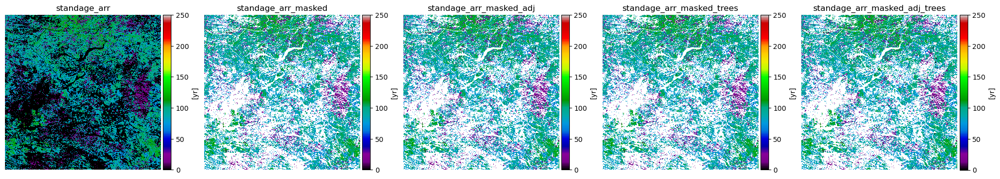

In [78]:
fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(25,5), sharex=True, sharey=True)
axes = axes.flatten()
title_list = ['standage_arr','standage_arr_masked','standage_arr_masked_adj','standage_arr_masked_trees','standage_arr_masked_adj_trees']
arr_list = [standage_arr, standage_arr_masked, standage_arr_masked_adj, standage_arr_masked_trees, standage_arr_masked_adj_trees]

for i,arr in enumerate(arr_list):
    
    print(f'{title_list[i]};\t\tshape: {arr.shape}; min: {arr.min()}; max: {arr.max()}')
    ax = axes[i]
    m = ax.imshow(arr[0,:,:], cmap='nipy_spectral', vmin=0, vmax=250, interpolation='nearest')
    add_colorbar(m, '[yr]')
    ax.set_title(title_list[i])
    ax.axis('off')

In [79]:
#
# LC masked with its nodata and water
#
#lc_arr_masked = np.ma.masked_where( (lc_arr == val_lc_nodata  ) | (lc_arr == val_lc_water) , lc_arr)
lc_arr_masked = np.ma.masked_where(np.isin(lc_arr, vals_lc_to_mask), lc_arr)
lc_arr_trees = np.ma.masked_where( (lc_arr != val_lc_trees  )  , lc_arr_masked)

In [80]:
#
# TCC variables masked with its nodata
#
tccslope_arr = np.ma.masked_where( (tccslope_arr == ndv_tccslope ) , tccslope_arr)
tcc2020_arr = np.ma.masked_where( (tcc2020_arr == ndv_tcc ) , tcc2020_arr)

In [83]:
#
# AGB masked with lc nodata
#
agb_water_arr_masked = np.ma.masked_where( (np.repeat(lc_arr, 2, axis=0) == val_lc_nodata  )  , agb_arr)
# # ..and additionally with water
# agb_arr_masked = np.ma.masked_where(  (lc_arr == val_lc_water) , agb_water_arr_masked)
agb_arr_masked = np.ma.masked_where(np.isin(np.repeat(lc_arr, 2, axis=0), vals_lc_to_mask), agb_arr)
# ..and additionally with ESA Worldover trees
agb_arr_masked_trees = np.ma.masked_where( (np.repeat(lc_arr, 2, axis=0) != val_lc_trees  ), agb_arr_masked)

In [86]:
height_arr.shape

(3000, 3000)

In [87]:
#
# Ht masked with lc nodata and water
#
height_arr_masked = np.ma.masked_where( np.isin(lc_arr[0,:,:], vals_lc_to_mask)  , height_arr)

In [89]:
#
# Decid fraction masked with lc nodata and water
#
decidpred_arr_masked = np.ma.masked_where( np.isin(lc_arr[0,:,:], vals_lc_to_mask)  , decidpred_arr)

In [90]:
print(standage_arr_masked.shape)
print(standage_arr_masked_adj.shape)

(2, 3000, 3000)
(2, 3000, 3000)


In [92]:
#
# Carbon accumulation (Mg/ha/yr) aka Growth Rate
#
ratio_c_agb = 0.5
print(agb_arr_masked.shape)
netc_accum_arr = (agb_arr_masked * ratio_c_agb) / standage_arr_masked[0,:,:]
netc_accum_arr_adj= (agb_arr_masked * ratio_c_agb) / standage_arr_masked_adj[0,:,:]
netc_accum_arr_trees = (agb_arr_masked_trees * ratio_c_agb) / standage_arr_masked[0,:,:]
netc_accum_arr_trees_adj = (agb_arr_masked_trees * ratio_c_agb) / standage_arr_masked_adj[0,:,:]
print(netc_accum_arr.shape)
print(netc_accum_arr_adj.shape)

(2, 3000, 3000)
(2, 3000, 3000)
(2, 3000, 3000)


In [93]:
lc_arr.shape

(1, 3000, 3000)

Extent:		1154

Total ha.:		1170264.96

Mean AGB Mg/ha in all classes (even water):		21.200000762939453
Total AGB Pg. in all classes (even water):	0.03099999949336052
Water AGB adds additional 0.0 Pg. to the Total land AGB, an increase of 0.0 %

Mean AGB Mg/ha:		21.200000762939453
Total AGB Pg.:		0.03099999949336052

Mean AGB Mg/ha in trees:	23.920000076293945
Total AGB Pg. in trees:	0.02800000086426735
Tree AGB is 0.9045000076293945 of Total land AGB

Mean Net C accumulation in trees:	0.23 MgC/ha/yr
Total Pg. C in trees:	0.0002 Pg
Mean Net C accumulation in all classes:	0.24 MgC/ha/yr
Total Pg. C in all classes:	0.0002 Pg
Tree C is 0.9702 of Total land aboveground C

This C proportion doesnt match the AGB proportion due to pixel with stand age = 0
---This doesnt make sense yet --> Adjusted Tree C is 0.9702 of Total land aboveground C



/opt/conda/envs/pangeo/lib/python3.12/site-packages/matplotlib_scalebar/scalebar.py:457: UserWarning: Drawing scalebar on axes with unequal aspect ratio; either call ax.set_aspect(1) or suppress the warning with rotation='horizontal-only'.


(np.float64(-0.5), np.float64(2999.5), np.float64(2999.5), np.float64(-0.5))

/opt/conda/envs/pangeo/lib/python3.12/site-packages/matplotlib_scalebar/scalebar.py:457: UserWarning: Drawing scalebar on axes with unequal aspect ratio; either call ax.set_aspect(1) or suppress the warning with rotation='horizontal-only'.


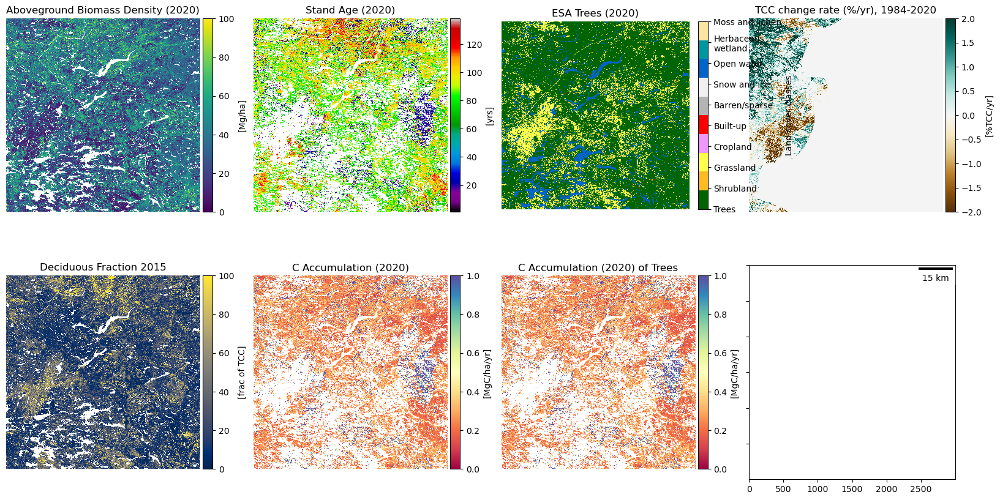

In [98]:
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(20,10), sharex=True, sharey=True)
axes = axes.ravel()
# Scalebar doesnt seem correct
scalebar = ScaleBar(30) # <-- each pixel (unit) is 30m
plt.gca().add_artist(scalebar)

# Get the total water AGB
land_water_agb_total = (np.nansum(agb_water_arr_masked)/1e9 * area_pix_ha)
land_agb_total = (np.nansum(agb_arr_masked)/1e9 * area_pix_ha)
water_agb_total = land_water_agb_total - land_agb_total

print(f"Extent:\t\t{TILE_NUM}\n")
print(f"Total ha.:\t\t{(agb_arr_masked_trees[~np.isnan(agb_arr_masked)].count() * area_pix_ha ) }\n")

print(f"Mean AGB Mg/ha in all classes (even water):\t\t{ round(np.nanmean(agb_arr),2) }")
print(f"Total AGB Pg. in all classes (even water):\t{round(np.nansum(agb_arr)/1e9 * area_pix_ha, 4) }")
print(f"Water AGB adds additional { round(water_agb_total, 6)} Pg. to the Total land AGB, an increase of { round(water_agb_total / land_agb_total * 100 , 3) } %\n")

# Land AGB
print(f"Mean AGB Mg/ha:\t\t{ round(np.nanmean(agb_arr_masked),2) }")
print(f"Total AGB Pg.:\t\t{round(np.nansum(agb_arr_masked)/1e9 * area_pix_ha,4) }\n")

# Tree AGB
print(f"Mean AGB Mg/ha in trees:\t{ round(np.nanmean(agb_arr_masked_trees),2) }")
print(f"Total AGB Pg. in trees:\t{round(np.nansum(agb_arr_masked_trees)/1e9 * area_pix_ha, 4) }")
print(f"Tree AGB is {round(  (np.nansum(agb_arr_masked_trees)/1e9 * area_pix_ha) / (np.nansum(agb_arr_masked)/1e9 * area_pix_ha)  , 4) } of Total land AGB\n")

# Carbon accumulation
print(f"Mean Net C accumulation in trees:\t{ round(np.nanmean( netc_accum_arr_trees),2) } MgC/ha/yr")
print(f"Total Pg. C in trees:\t{round(np.nansum(netc_accum_arr_trees)/1e9 * area_pix_ha, 4) } Pg")
print(f"Mean Net C accumulation in all classes:\t{ round(np.nanmean( netc_accum_arr),2) } MgC/ha/yr")
print(f"Total Pg. C in all classes:\t{round(np.nansum(netc_accum_arr)/1e9 * area_pix_ha, 4) } Pg")
print(f"Tree C is {round(  (np.nansum(netc_accum_arr_trees)/1e9 * area_pix_ha) / (np.nansum(netc_accum_arr)/1e9 * area_pix_ha)  , 4) } of Total land aboveground C\n")
print("This C proportion doesnt match the AGB proportion due to pixel with stand age = 0")
print(f"---This doesnt make sense yet --> Adjusted Tree C is {round(  (np.nansum(netc_accum_arr_trees_adj)/1e9 * area_pix_ha) / (np.nansum(netc_accum_arr_adj)/1e9 * area_pix_ha)  , 4) } of Total land aboveground C\n")

# Plots
#
# Biomass
m1 = axes[0].imshow(agb_arr_masked[0,:,:], clim=(0,100) , interpolation='nearest')
add_colorbar(m1, '[Mg/ha]')
m1 = axes[0].set_title('Aboveground Biomass Density (2020)')
axes[0].axis('off')

# Age
m2 = axes[1].imshow(standage_arr_masked_adj[0,:,:], cmap='nipy_spectral', interpolation='nearest')
add_colorbar(m2, '[yrs]')
axes[1].set_title('Stand Age (2020)')
axes[1].axis('off')
EXTENT_gdf.plot(ax=axes[1], facecolor='none', edgecolor='red')

# Showing trees instead of all LC classes
m3 = axes[2].imshow(lc_arr[0,:,:], cmap=get_discrete_cmap(cmap=cmap_worldcover, N_COLORS=len(dict_worldcover_classes.values()))
                    #, norm=norm_worldcover
                    , vmin=LC_ticks[0], vmax=LC_ticks[-1], interpolation='nearest'
                   )
cbar = do_colorbar(axes[2], fig, m3, 'Land cover classes', EXTEND=None, TICKS=LC_ticks)
cbar.ax.set_yticklabels(dict_worldcover_classes.values())

# m3 = axes[2].imshow(lc_arr_trees, cmap=cmap_worldcover, norm=norm_worldcover)
# add_colorbar(m3, 'Land cover classes')
axes[2].set_title('ESA Trees (2020)')
axes[2].axis('off')

# TCC trend 1984-2020
m = axes[3].imshow(tccslope_arr, clim=(-2,2), cmap='BrBG', interpolation='nearest')
add_colorbar(m, '[%TCC/yr]')
m = axes[3].set_title('TCC change rate (%/yr), 1984-2020')
axes[3].axis('off')

# Decid fraction
m = axes[4].imshow(decidpred_arr_masked, clim=(0,100), cmap='cividis', interpolation='nearest')
add_colorbar(m, '[frac of TCC]')
m = axes[4].set_title('Deciduous Fraction 2015')
axes[4].axis('off')

# Carbon accumulation in all classes
m = axes[5].imshow(netc_accum_arr[0,:,:], clim=(0,1), cmap='Spectral', interpolation='nearest')
add_colorbar(m, '[MgC/ha/yr]')
m = axes[5].set_title('C Accumulation (2020)')
axes[5].axis('off')

# Carbon accumulation in trees
m = axes[6].imshow(netc_accum_arr_trees[0,:,:], clim=(0,1), cmap='Spectral', interpolation='nearest')
add_colorbar(m, '[MgC/ha/yr]')
m = axes[6].set_title('C Accumulation (2020) of Trees')
axes[6].axis('off')


#### Check trees and C accum with larger maps

(np.float64(-0.5), np.float64(2999.5), np.float64(2999.5), np.float64(-0.5))

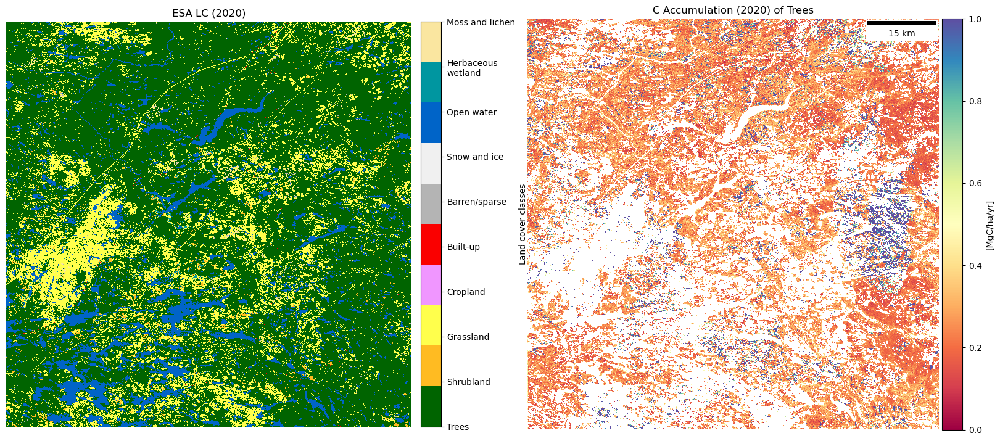

In [100]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20,20), sharex=True, sharey=True)

# Scalebar doesnt seem correct
scalebar = ScaleBar(30) # <-- each pixel (unit) is 30m
plt.gca().add_artist(scalebar)

# Showing trees instead of all LC classes
# m3 = axes[0].imshow(lc_arr_masked, cmap=cmap_worldcover, norm=norm_worldcover)
# add_colorbar(m3, 'Land cover classes')
m3 = axes[0].imshow(lc_arr[0,:,:], cmap=get_discrete_cmap(cmap=cmap_worldcover, N_COLORS=len(dict_worldcover_classes.values()))
                    #, norm=norm_worldcover
                    , vmin=LC_ticks[0], vmax=LC_ticks[-1], interpolation='nearest'
                   )
cbar = do_colorbar(axes[0], fig, m3, 'Land cover classes', EXTEND=None, TICKS=LC_ticks)
cbar.ax.set_yticklabels(dict_worldcover_classes.values())
axes[0].set_title('ESA LC (2020)')
axes[0].axis('off')

# Carbon accumulation in trees
m4 = axes[1].imshow(netc_accum_arr_trees[0,:,:], clim=(0,1), cmap='Spectral', interpolation='nearest')
add_colorbar(m4, '[MgC/ha/yr]')
m4 = axes[1].set_title('C Accumulation (2020) of Trees')
axes[1].axis('off')

## Classifiers

#### Stand Age Classes
+ 36 yr threshold gives us a Landsat record interval (1984-2020)
+ 120 yr threshold could be near where boreal AGB growth asymptotes (100-120 yrs) (Shibuya, M., H. Saito, T. Sawamoto, R. Hatano, T. Yajima, K. Takahashi, et al. 2004. Time trend in aboveground biomass, net primary production, and carbon storage of natural Larix gmelinii stands in Eastern Siberia. Eurasian J. For. Res. 7: 67–74.)

In [101]:
np.unique(standage_arr_masked).data
standage_arr_masked.data.min()

np.float64(-9999.0)

In [102]:
THRESH_REGROW_AGE, THRESH_YOUNG_AGE, THRESH_MATURE_AGE = [36, 100, 150] #THRESH_OLD_AGE is > 150

In [103]:
print(standage_classified.shape)

(3000, 3000)


In [105]:
# # All nodata pixels in forest/stand age will be class'd as non-forest
# if AGE_DATA == 'TP':
#     standage_classified = np.ma.where(standage_arr_masked == 0, 0, 
#                                           np.ma.where( ((standage_arr_masked > 0) & (standage_arr_masked < THRESH_REGROW_AGE)), 1, 
#                                                      np.ma.where(standage_arr_masked >= THRESH_REGROW_AGE, 2, 3) ))
#     #standage_arr_masked = np.ma.masked_where( np.isin(lc_arr, vals_lc_to_mask) , standage_arr_masked)

# if AGE_DATA == 'BESNARD':
#     standage_arr_masked_TMP = np.ma.where(standage_arr[0,:,:] < 0, 0, standage_arr[0,:,:])
#     standage_classified = np.ma.where(standage_arr_masked_TMP == 0, 0, 
#                                           np.ma.where( ((standage_arr_masked_TMP > 0) & (standage_arr_masked_TMP < THRESH_REGROW_AGE)), 1, 
#                                                      (np.ma.where( ((standage_arr_masked_TMP >= THRESH_REGROW_AGE)  & (standage_arr_masked_TMP < THRESH_YOUNG_AGE)), 2, 
#                                                          (np.ma.where( ((standage_arr_masked_TMP >= THRESH_YOUNG_AGE)  & (standage_arr_masked_TMP < THRESH_MATURE_AGE)), 3,         
#                                                                  4
#                                                                             ))))))
#     #standage_arr_masked = np.ma.masked_where( (lc_arr == val_lc_nodata  ) | (lc_arr == val_lc_water) , standage_arr_masked_TMP[0,:,:])
#     #standage_arr_masked = np.ma.masked_where( np.isin(lc_arr, vals_lc_to_mask) , standage_arr_masked_TMP)

# #standage_classified = np.ma.masked_where( (lc_arr == val_lc_nodata  ) | (lc_arr == val_lc_water) , standage_classified)
# standage_classified = np.ma.masked_where( np.isin(lc_arr, vals_lc_to_mask) , standage_classified)
# np.unique(standage_classified).data

In [374]:
standage_arr_masked_TMP.shape
vals_lc_to_mask


[0, 80]

In [375]:
names_standage

['non-forest',
 're-growth forest',
 'young forest',
 'mature forest',
 'old-growth forest']

### Decid fraction classes

In [376]:
THRESH_CONIFER, THRESH_DECID = [33, 66]
decidpred_arr.min()

np.uint8(0)

In [377]:
decidpred_arr_masked_TMP = np.ma.where(decidpred_arr < 0, np.nan, decidpred_arr)
decidpred_classified = np.ma.where(decidpred_arr_masked < THRESH_CONIFER, 0, 
                                          np.ma.where( ((decidpred_arr_masked >= THRESH_CONIFER) & (decidpred_arr_masked <= THRESH_DECID)), 1, 
                                                     np.ma.where(decidpred_arr_masked > THRESH_DECID, 2, 3) ))

In [378]:
names_decidpred

['conifer', 'mixed', 'deciduous']

(np.float64(-0.5), np.float64(2999.5), np.float64(2999.5), np.float64(-0.5))

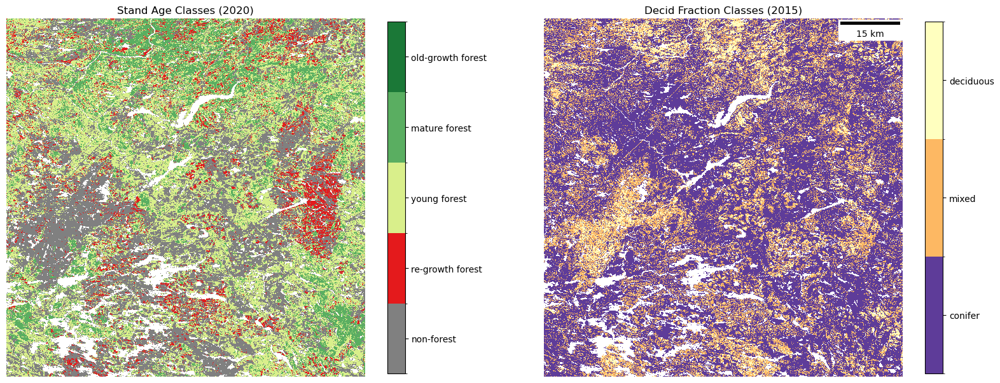

In [864]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20,9), sharex=True, sharey=True)

# Scalebar doesnt seem correct
scalebar = ScaleBar(30) # <-- each pixel (unit) is 30m
plt.gca().add_artist(scalebar)

norm_standage_cats = mcolors.BoundaryNorm(np.arange(-0.5, len(names_standage)+0.5, 1), cmap_standage.N)

# Showing trees instead of all LC classes
im = axes[0].imshow(standage_classified, cmap=cmap_standage
                 , norm=norm_standage_cats, interpolation='nearest'
                )
#add_colorbar(z, 'Stand age classes')
# Add a colorbar
cbar = fig.colorbar(im, ticks=np.arange(len(names_standage)), shrink=0.8)
cbar.ax.set_yticklabels(names_standage)

axes[0].set_title('Stand Age Classes (2020)')
axes[0].axis('off')

norm_decidpred_cats = mcolors.BoundaryNorm(np.arange(-0.5, len(names_decidpred)+0.5, 1), cmap_decidpred.N) 

# Showing trees instead of all LC classes
im = axes[1].imshow(decidpred_classified, cmap=cmap_decidpred, norm=norm_decidpred_cats, interpolation='nearest')
# Add a colorbar
#add_colorbar(im, ' ')

cbar = fig.colorbar(im, ticks=np.arange(len(names_decidpred)), shrink=0.8)
cbar.ax.set_yticklabels(names_decidpred)
axes[1].set_title('Decid Fraction Classes (2015)')
axes[1].axis('off')

### Issue - areas of 'non-forest' (gray)
+ these areas dont meet the def of forest and thus dont have an age estimate
+ this def of forest is probably too strict - and so exludes lots of recovering forests (eg., see many Siberia burn scars)
+ can we estimate Stand Age using the regional site index models in Montesano et al (https://iopscience.iop.org/article/10.1088/1748-9326/acdcab)

In [108]:
# fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20,9), sharex=True, sharey=True)

# # Scalebar doesnt seem correct
# scalebar = ScaleBar(30) # <-- each pixel (unit) is 30m
# plt.gca().add_artist(scalebar)

# # Height

# m1 = axes[0].imshow(height_arr_masked, clim=(0,30), cmap='magma' , interpolation='nearest')
# add_colorbar(m1, '[m]')
# m1 = axes[0].set_title('Height (2020)')
# axes[0].axis('off')

# m2 = axes[1].imshow(np.ma.masked_where((standage_classified != 0), height_arr_masked), clim=(0,5), cmap='plasma' , interpolation='nearest')
# add_colorbar(m2, '[m]')
# m2 = axes[1].set_title('Height (2020) in non-forest')
# axes[1].axis('off')

In [382]:
agb_arr_masked2 = np.ma.masked_where( np.isin(lc_arr_3d_2 , vals_lc_to_mask), np.stack([agb_arr, agb_std_arr]))
agb_arr_masked2.shape

(2, 3000, 3000)

## Uncertainty of AGB total

In [109]:
# %%time
# mean_of_sums, std_of_sums, random_sample = monte_carlo_raster_uncertainty(agb_arr_masked2, num_simulations=10)

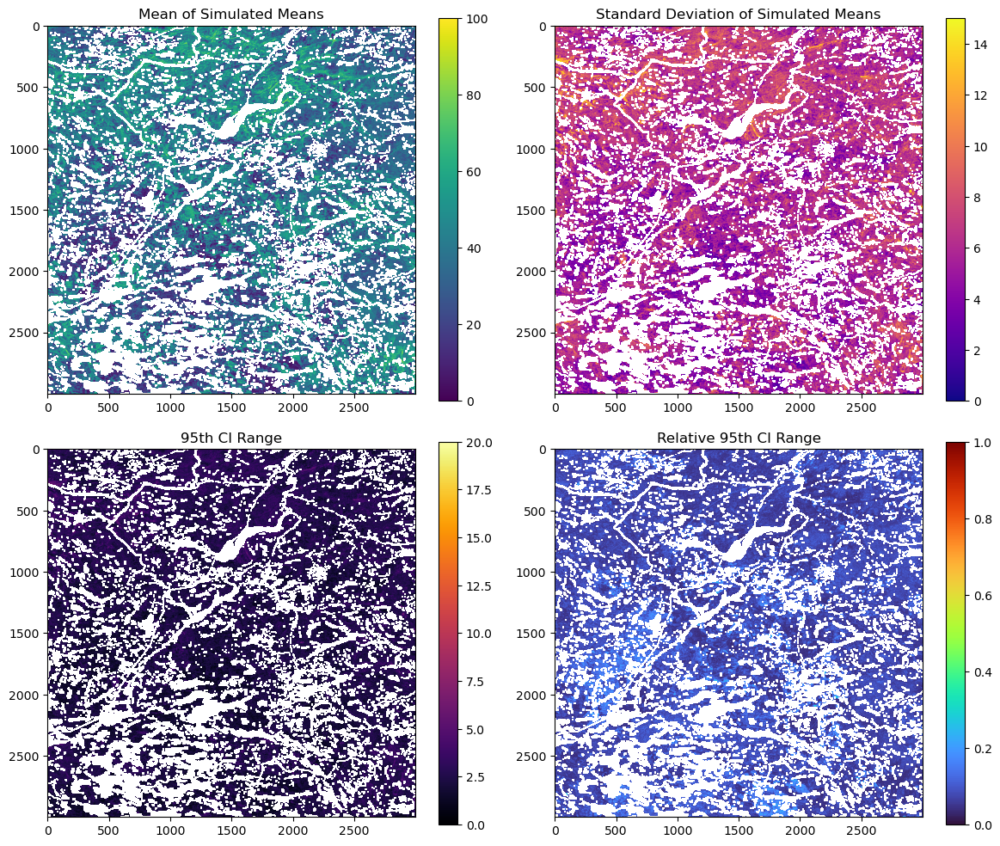

CPU times: user 59.9 s, sys: 24.8 s, total: 1min 24s
Wall time: 1min 25s


In [540]:
%%time
results = monte_carlo_uncertainty(agb_arr_masked2, n_simulations=100, confidence=0.95)

In [541]:
results.keys()

dict_keys(['mean_of_means', 'std_of_means', 'ci_lower', 'ci_upper', 'pi_lower', 'pi_upper', 'agb_total_pg', 'mean_sum_pg', 'std_sum_pg', 'sum_ci_lower_pg', 'sum_ci_upper_pg', 'sum_pi_lower_pg', 'sum_pi_upper_pg', 'simulation_sums_pg'])


Total Sum Statistics:
Mean Sum: 0.0265450
95% Confidence Interval: (0.0265447, 0.0265454)
95% Prediction Interval: (0.0265417, 0.0265484)


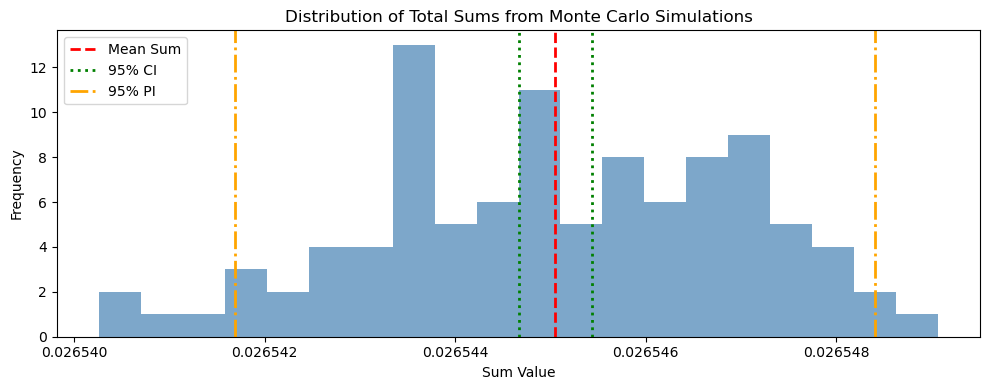

In [546]:
# Print summary statistics for the total sum
print("\nTotal Sum Statistics:")
print(f"Mean Sum: {results['mean_sum_pg']:.7f}")
print(f"95% Confidence Interval: ({results['sum_ci_lower_pg']:.7f}, {results['sum_ci_upper_pg']:.7f})")
print(f"95% Prediction Interval: ({results['sum_pi_lower_pg']:.7f}, {results['sum_pi_upper_pg']:.7f})")

# Visualize distribution of simulation sums
plt.figure(figsize=(10, 4))
plt.hist(results['simulation_sums_pg'], bins=20, alpha=0.7, color='steelblue')
plt.axvline(results['mean_sum_pg'], color='red', linestyle='--', linewidth=2, label='Mean Sum')
plt.axvline(results['sum_ci_lower_pg'], color='green', linestyle=':', linewidth=2, label='95% CI')
plt.axvline(results['sum_ci_upper_pg'], color='green', linestyle=':', linewidth=2)
plt.axvline(results['sum_pi_lower_pg'], color='orange', linestyle='-.', linewidth=2, label='95% PI')
plt.axvline(results['sum_pi_upper_pg'], color='orange', linestyle='-.', linewidth=2)
plt.xlabel('Sum Value')
plt.ylabel('Frequency')
plt.title('Distribution of Total Sums from Monte Carlo Simulations')
plt.legend()
plt.tight_layout()
plt.savefig('sum_distribution.png', dpi=300)
plt.show()

In [188]:
def tcctrend_classifier(row):
    
    if row["TCC_trend"] < -2  :
        return 'decline\n(strong)'
    elif (row["TCC_trend"] >=-2) & (row["TCC_trend"] < -0.5):
        return 'decline\n(weak)'
    elif (row["TCC_trend"] <= 2) & (row["TCC_trend"] > 0.5):
        return 'increase\n(weak)'
    elif row["TCC_trend"] > 2  :
        return 'increase\n(strong)'
    else:
        return "stable"

def tccpval_classifier(row):
    if row["TCC_trend_pval"] >= 0.05 :
        return 'not sig'
    # else row["TCC_trend_pval"] < 0.05:
    #     return 'sig (p<0.05)'
    # elif row["TCC_trend_pval"] < 0.01:
    #     return 'sig (p<0.01)'
    else:
        return 'sig (p<0.05)'
        
# Get a general TCC class to help understand TP 'non-forest' class with respect to ESA LC class
def tcc2020_classifier(row):
    if row["TCC_2020"] >= 20 :
        return '>=20%'
    else:
        return "<20%"
    
def decidfrac_classifier(row):
    if row["DecidPred2015"] > THRESH_DECID :
        return 'deciduous'
    elif row["DecidPred2015"] < THRESH_CONIFER:
        return 'conifer'
    elif (row["DecidPred2015"] >= THRESH_CONIFER) & (row["DecidPred2015"] <= THRESH_DECID):
        return 'mixed'
    else:
        return "?"

def age2020_interval_classifier(row):
    if row['Age2020'] == 0:
        return 'non-forest'
    elif (row['Age2020'] > 0) & (row['Age2020'] <=20):
        return '1-20'
    elif (row['Age2020'] > 20) & (row['Age2020'] <= 40):
        return '21-40'
    elif (row['Age2020'] > 40) & (row['Age2020'] <= 60):
        return '41-60'
    elif (row['Age2020'] > 60) & (row['Age2020'] <= 80):
        return '61-80'
    elif (row['Age2020'] > 80) & (row['Age2020'] <= 100):
        return '81-100'
    elif (row['Age2020'] > 100) & (row['Age2020'] <= 120):
        return '101-120'
    elif (row['Age2020'] > 120) & (row['Age2020'] <= 140):
        return '121-140'
    elif (row['Age2020'] > 140) & (row['Age2020'] <= 160):
        return '141-160'
    elif (row['Age2020'] > 160) & (row['Age2020'] <= 180):
        return '161-180'
    elif (row['Age2020'] > 180) & (row['Age2020'] <= 200):
        return '181-200'
    elif row['Age2020'] > 200:
        return '>200'
    else:
        return '?'

### Stack arrays; build data frame

In [56]:
%%time

# Build the stack
arr_list = common_mask([lc_arr_masked, agb_arr_masked, standage_arr_masked, standage_classified, netc_accum_arr, tccslope_arr, tcc2020_arr, tccpvalue_arr, decidpred_arr_masked], apply=True)

print(arr_list[0].count())

stack = np.stack([arr[(netc_accum_arr>=0) & (tcc2020_arr < 255) & (agb_arr_masked > -9999)].data.flatten() for arr in arr_list],axis=1)
#stack = np.stack([arr.data.flatten() for arr in arr_list], axis=1)
print(stack.shape)

# Common mask
#stack = common_mask(stack, apply=True)

# Build data frame
VARS_LIST = ['LC','Mg_ha', 'Age2020', 'Age_class','Mg_C_ha_yr','TCC_trend','TCC_2020', 'TCC_trend_pval','DecidPred2015']
stack_df = pd.DataFrame(stack, columns = VARS_LIST)

print('.. Cleaning ...')
stack_df['TCC_trend_class'] = stack_df.apply(tcctrend_classifier, axis=1)
stack_df['TCC_trend_class']  = pd.Categorical(stack_df['TCC_trend_class'] , categories=['decline\n(strong)', 'decline\n(weak)', 'stable', 'increase\n(weak)', 'increase\n(strong)'], ordered=True)
stack_df['TCC_trend_pval_class'] = stack_df.apply(tccpval_classifier, axis=1)
stack_df['TCC_trend_pval_class']  = pd.Categorical(stack_df['TCC_trend_pval_class'] , categories=['not sig', 'sig (p<0.05)'], ordered=True) #, 'sig (p<0.01)'
stack_df['TCC2020_class'] = stack_df.apply(tcc2020_classifier, axis=1)
stack_df['TCC2020_class']  = pd.Categorical(stack_df['TCC2020_class'] , categories=['>=20%', "<20%"], ordered=True)
stack_df['DecidPred2015_class'] = stack_df.apply(decidfrac_classifier, axis=1)
stack_df['DecidPred2015_class']  = pd.Categorical(stack_df['DecidPred2015_class'] , categories=names_decidpred, ordered=True) 

remap_dict = dict(zip(values_standage, names_standage))
stack_df['Age_class'] = stack_df['Age_class'].replace(remap_dict)
stack_df['Age_class'] = pd.Categorical(stack_df['Age_class'], categories=names_standage, ordered=True)

remap_dict = dict(zip(values_worldcover, names_worldcover))
stack_df['LC'] = stack_df['LC'].replace(remap_dict)
stack_df['LC'] = pd.Categorical(stack_df['LC'], categories=names_worldcover, ordered=True)

remap_dict = dict(zip(values_standage, names_standage))
stack_df['Age_interval'] = stack_df.apply(age2020_interval_classifier, axis=1)
#stack_df['Age_interval'] = pd.Categorical(stack_df['Age_interval'], ###categories=names_standage, ordered=True)

stack_df['Mg'] = stack_df['Mg_ha'] * area_pix_ha

7147421
(8939848, 8)
.. Cleaning ...
CPU times: user 4min 11s, sys: 10.4 s, total: 4min 21s
Wall time: 4min 21s


,LC,Mg_ha,Age_class,Mg_C_ha_yr,TCC_trend,TCC_2020,TCC_trend_pval,DecidPred2015,TCC_trend_class,TCC_trend_pval_class,TCC2020_class,DecidPred2015_class,Mg
0,Trees,149.959488,non-forest,74.979744,0.000000,84.0,1.000000,61.0,stable,not sig,>=20%,mixed,13.496354
1,Trees,135.154388,mature forest,0.470102,0.008535,77.0,0.092071,61.0,stable,not sig,>=20%,mixed,12.163895
2,Trees,154.819366,mature forest,0.565034,-0.005927,82.0,0.296043,56.0,stable,not sig,>=20%,mixed,13.933743
3,Trees,157.752731,mature forest,0.575740,0.000948,80.0,0.956558,56.0,stable,not sig,>=20%,mixed,14.197746
4,Trees,141.252121,non-forest,70.626060,0.038170,80.0,0.059438,62.0,stable,not sig,>=20%,mixed,12.712691


### Save data frame

In [57]:
out_stack_stem = os.path.join(os.path.dirname(BASIN_COG_DICT['extent_gdf_fn']) , f"boreal_dynamics_trees_{ID}").replace('s3://maap-ops-workspace/shared/montesano','/projects/my-public-bucket/')
out_stack_stem

'/projects/my-public-bucket/local_output/extent_stack_boreal_fire/output/build_stack_clips/boreal_dynamics_trees_3105'

In [58]:
stack_df.to_csv(out_stack_stem + '.csv')

In [59]:
#stack_df.to_parquet(out_stack_stem + '.parquet')

In [60]:
stack_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8939848 entries, 0 to 8939847
Data columns (total 13 columns):
 #   Column                Dtype   
---  ------                -----   
 0   LC                    category
 1   Mg_ha                 float64 
 2   Age_class             category
 3   Mg_C_ha_yr            float64 
 4   TCC_trend             float64 
 5   TCC_2020              float64 
 6   TCC_trend_pval        float64 
 7   DecidPred2015         float64 
 8   TCC_trend_class       category
 9   TCC_trend_pval_class  category
 10  TCC2020_class         category
 11  DecidPred2015_class   category
 12  Mg                    float64 
dtypes: category(6), float64(7)
memory usage: 528.6 MB


### Build summary table

In [61]:
stack_df_smry = pd.DataFrame(
    stack_df.groupby(["LC","Age_interval","Age_class","TCC_trend_class","TCC_trend_pval_class",'TCC2020_class',"DecidPred2015_class"]).agg(
            {
            "Mg":         ["sum"], #, "min", "max", "median", "skew", "std", "count"], # np.nansum(netc_accum_arr_trees)/1e9 * area_pix_ha
            "Mg_ha":      ["sum"], #, "min", "max", "median", "skew", "std", "count"], # np.nansum(netc_accum_arr_trees)/1e9 * area_pix_ha
            "TCC_2020":   ["min", "max", "median", "std", "count"], #, "skew"
            "Mg_C_ha_yr": ["min", "max", "median", "std", "count"]#, #, "skew"
            #"Age_yr": ["min", "max", "median", "skew", "std", "count"]
            }
                        )  
)
##stack_df_smry['LC'] = stack_df_smry.index

stack_df_smry.reset_index(drop=False, inplace=True)

stack_df_smry.columns = [' '.join(col).strip() for col in stack_df_smry.columns.values]

# Convert sum to Pg, normalize sum by area of pixel
stack_df_smry['Total AGB [Pg]'] = stack_df_smry['Mg_ha sum']/1e9 * area_pix_ha

/tmp/ipykernel_38373/2307729604.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


In [62]:
stack_df_smry.to_csv(out_stack_stem + '_smry.csv')

In [63]:
out_stack_stem

'/projects/my-public-bucket/local_output/extent_stack_boreal_fire/output/build_stack_clips/boreal_dynamics_trees_3105'

### Stand age, carbon accumulation, and tree cover rate change maps

(np.float64(-0.5), np.float64(2999.5), np.float64(2999.5), np.float64(-0.5))

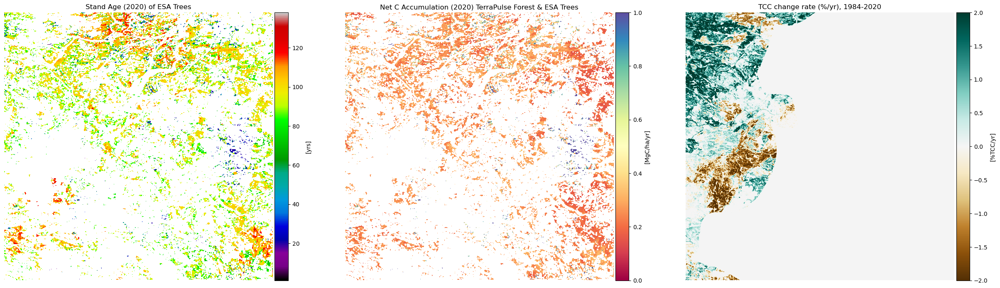

In [529]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(30,30), sharex=True, sharey=True)

# Age
m2 = axes[0].imshow(standage_arr_masked_trees[0,:,:], cmap='nipy_spectral')
add_colorbar(m2, '[yrs]')
axes[0].set_title('Stand Age (2020) of ESA Trees')
axes[0].axis('off')

# Carbon accumulation
m5 = axes[1].imshow(netc_accum_arr_trees, clim=(0,1), cmap='Spectral')
add_colorbar(m5, '[MgC/ha/yr]')
m5 = axes[1].set_title('Net C Accumulation (2020) TerraPulse Forest & ESA Trees')
axes[1].axis('off')

# TCC trend 1984-2020
m6 = axes[2].imshow(tccslope_arr, clim=(-2,2), cmap='BrBG')
add_colorbar(m6, '[%TCC/yr]')
m6 = axes[2].set_title('TCC change rate (%/yr), 1984-2020')
axes[2].axis('off')

### Binned scatterplots

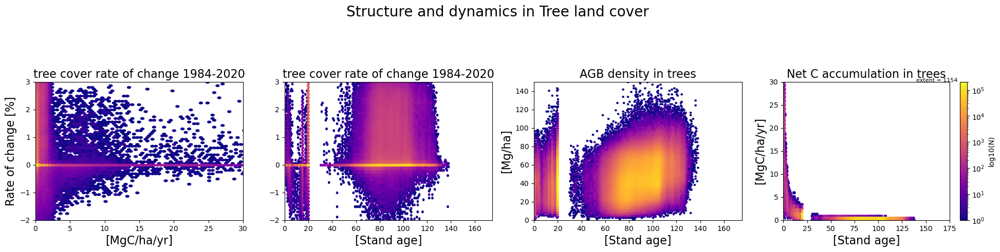

In [532]:
# Mask TCC trends with 
tccslope_masked = np.ma.masked_where(netc_accum_arr_trees.mask, tccslope_arr)

lims_c_accum = [0,30]
lims_stand_age = [0, 175]
lims_tcc_change = [-2, 3]

#Declaring the figure, and hiding the ticks' labels
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(24,5))
st = fig.suptitle("Structure and dynamics in Tree land cover", fontsize=20,  horizontalalignment='center')

## Actually Plotting the data
# Binned scatterplots
ax1.hexbin(np.ravel(netc_accum_arr_trees), np.ravel(tccslope_masked), gridsize=100, bins='log', cmap='plasma')
ax2.hexbin(np.ravel(standage_arr_masked_trees[0,:,:]), np.ravel(tccslope_masked), gridsize=100, bins='log', cmap='plasma')
ax3.hexbin(np.ravel(standage_arr_masked_trees[0,:,:]), np.ravel(agb_arr_masked_trees), gridsize=100, bins='log', cmap='plasma')
hb=ax4.hexbin(np.ravel(standage_arr_masked_trees[0,:,:]), np.ravel(netc_accum_arr_trees), gridsize=100, bins='log', cmap='plasma')


# Scatterplots
#ax1.scatter(np.ravel(netc_accum_arr_trees), np.ravel(tccslope_masked),  s=0.1, c='black', alpha=0.01)
#ax2.scatter(np.ravel(standage_arr_masked_trees), np.ravel(tccslope_masked),  s=0.1, c='black', alpha=0.01)
#ax3.scatter(np.ravel(standage_arr_masked_trees), np.ravel(netc_accum_arr_trees),  s=0.1, c='black', alpha=0.01)

#Making the graph pretty and informative!
ax1.set_title("tree cover rate of change 1984-2020", fontsize=16)
ax1.set_ylabel("Rate of change [%]", fontsize=16)
ax1.set_xlabel("[MgC/ha/yr]", fontsize=16)
ax1.set_ylim(lims_tcc_change)

ax2.set_title("tree cover rate of change 1984-2020", fontsize=16)
ax2.set_xlabel("[Stand age]", fontsize=16)
ax2.set_ylim(lims_tcc_change)

ax3.set_title("AGB density in trees", fontsize=16)
ax3.set_ylabel("[Mg/ha]", fontsize=16)
ax3.set_ylim((0,150))
ax3.set_xlabel("[Stand age]", fontsize=16)

ax4.set_title("Net C accumulation in trees", fontsize=16)
ax4.set_ylabel("[MgC/ha/yr]", fontsize=16)
ax4.set_ylim(lims_c_accum)
ax4.set_xlabel("[Stand age]", fontsize=16)
ax4.text(0.80,
         1.0, 
         f"extent = {extent_id}",
         transform=plt.gca().transAxes,
         color = "black",
         fontsize=8
        )
cb = fig.colorbar(hb, ax=ax4)
cb.set_label('log10(N)')

# shift subplots down:
st.set_y(0.95)
fig.subplots_adjust(top=0.65)

ax1.set_xlim(lims_c_accum)
#ax1.set_xscale('log')
ax2.set_xlim(lims_stand_age)
ax3.set_xlim(lims_stand_age)
ax4.set_xlim(lims_stand_age)
plt.show()

# Try this next but need to remove nans from each array: https://stackoverflow.com/questions/20105364/how-can-i-make-a-scatter-plot-colored-by-density-in-matplotlib

## Questions to answer
For trees in stands =< 36 yrs, 
1. what is the total AGB (Pg) and what is C?  
2. what is the percentage of overall C?

## Write a new stack
Band 1: ESA WorldCover  
Band 2: ABoVE AGB for ESA veg mask  
Band 3: ABoVE AGB for ESA tree mask  
Band 4: ABoVE Net C accumulation in trees with stand age (TP forest stand age x ESA tree mask ) 
 - not doing this stack correctly - fill value and nodata need to be looked at


In [66]:
out_stack_fn = out_stack_stem + '.tif'
out_stack_fn

'/projects/my-public-bucket/local_output/extent_stack_boreal_fire/output/build_stack_clips/boreal_dynamics_trees_3105.tif'

In [67]:
if False:
    # Stack
    # move axis of the stack so bands is first
    # LC array (int) mask filled with 0 .... AGB arrays (floats) filled with nan
    #analysis_stack = np.stack([lc_arr.filled(0) , agb_arr_masked.filled(-9999) , agb_arr_masked_trees.filled(-9999) ])
    analysis_stack = np.stack([lc_arr, agb_arr_masked , agb_arr_masked_trees,  standage_arr_masked_trees, tccslope_masked])
    analysis_stack_names = ["lc", "agb_veg", "agb_tree", "stand_age", "tcc_trend"]
    
    # Copy input agb metadata
    out_meta = dataset_agb.profile
    out_meta
    
    # write COG to disk
    write_cog(
                analysis_stack, 
                out_stack_fn, 
                out_meta['crs'], 
                out_meta['transform'], 
                analysis_stack_names, 
                out_crs=out_meta['crs'],
        input_nodata_value= -9999
                 )